## Exoplanet Analysis - NASA Kepler Mission

In [1]:
# Import all the needed libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.stats import ttest_ind, pearsonr
from sklearn.cluster import KMeans
import plotly.express as px

In [2]:
# load the dataset into pandas
df=pd.read_csv('cumulative_2024.11.08_09.15.14_clean.csv')
df=pd.DataFrame(df)

In [3]:
# Display the first 5 rows
df.head()

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_vet_stat,koi_vet_date,koi_pdisposition,koi_score,koi_fpflag_nt,...,koi_dicco_mdec,koi_dicco_mdec_err,koi_dicco_msky,koi_dicco_msky_err,koi_dikco_mra,koi_dikco_mra_err,koi_dikco_mdec,koi_dikco_mdec_err,koi_dikco_msky,koi_dikco_msky_err
0,1,10797460,K00752.01,Kepler-227 b,CONFIRMED,Done,16/08/2018,CANDIDATE,1.000,0,...,0.200,0.160,0.200,0.170,0.080,0.130,0.310,0.170,0.320,0.160
1,2,10797460,K00752.02,Kepler-227 c,CONFIRMED,Done,16/08/2018,CANDIDATE,0.969,0,...,0.000,0.480,0.390,0.360,0.490,0.340,0.120,0.730,0.500,0.450
2,3,10811496,K00753.01,NaN,CANDIDATE,Done,16/08/2018,CANDIDATE,0.000,0,...,-0.034,0.070,0.042,0.072,0.002,0.071,-0.027,0.074,0.027,0.074
3,4,10848459,K00754.01,NaN,FALSE POSITIVE,Done,16/08/2018,FALSE POSITIVE,0.000,0,...,0.147,0.078,0.289,0.079,-0.257,0.072,0.099,0.077,0.276,0.076
4,5,10854555,K00755.01,Kepler-664 b,CONFIRMED,Done,16/08/2018,CANDIDATE,1.000,0,...,-0.090,0.180,0.100,0.140,0.070,0.180,0.020,0.160,0.070,0.200


In [4]:
# Observing the total rows and columns of the dataset
df.shape

(9564, 141)

In [5]:
# Getting all the columns names
df.columns

Index(['rowid', 'kepid', 'kepoi_name', 'kepler_name', 'koi_disposition',
       'koi_vet_stat', 'koi_vet_date', 'koi_pdisposition', 'koi_score',
       'koi_fpflag_nt',
       ...
       'koi_dicco_mdec', 'koi_dicco_mdec_err', 'koi_dicco_msky',
       'koi_dicco_msky_err', 'koi_dikco_mra', 'koi_dikco_mra_err',
       'koi_dikco_mdec', 'koi_dikco_mdec_err', 'koi_dikco_msky',
       'koi_dikco_msky_err'],
      dtype='object', length=141)

In [6]:
# Does not show all the columns, so we are displaying them using head and widening the display

In [7]:
# Set pandas to display all columns
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)  # Widen the display width for large dataframes

In [8]:
df.head()

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_vet_stat,koi_vet_date,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_disp_prov,koi_comment,koi_period,koi_period_err1,koi_period_err2,koi_time0bk,koi_time0bk_err1,koi_time0bk_err2,koi_time0,koi_time0_err1,koi_time0_err2,koi_eccen,koi_eccen_err1,koi_eccen_err2,koi_longp,koi_longp_err1,koi_longp_err2,koi_impact,koi_impact_err1,koi_impact_err2,koi_duration,koi_duration_err1,koi_duration_err2,koi_ingress,koi_ingress_err1,koi_ingress_err2,koi_depth,koi_depth_err1,koi_depth_err2,koi_ror,koi_ror_err1,koi_ror_err2,koi_srho,koi_srho_err1,koi_srho_err2,koi_fittype,koi_prad,koi_prad_err1,koi_prad_err2,koi_sma,koi_sma_err1,koi_sma_err2,koi_incl,koi_incl_err1,koi_incl_err2,koi_teq,koi_teq_err1,koi_teq_err2,koi_insol,koi_insol_err1,koi_insol_err2,koi_dor,koi_dor_err1,koi_dor_err2,koi_limbdark_mod,koi_ldm_coeff4,koi_ldm_coeff3,koi_ldm_coeff2,koi_ldm_coeff1,koi_parm_prov,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_tce_plnt_num,koi_tce_delivname,koi_quarters,koi_bin_oedp_sig,koi_trans_mod,koi_model_dof,koi_model_chisq,koi_datalink_dvr,koi_datalink_dvs,koi_steff,koi_steff_err1,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_smet,koi_smet_err1,koi_smet_err2,koi_srad,koi_srad_err1,koi_srad_err2,koi_smass,koi_smass_err1,koi_smass_err2,koi_sage,koi_sage_err1,koi_sage_err2,koi_sparprov,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag,koi_fwm_stat_sig,koi_fwm_sra,koi_fwm_sra_err,koi_fwm_sdec,koi_fwm_sdec_err,koi_fwm_srao,koi_fwm_srao_err,koi_fwm_sdeco,koi_fwm_sdeco_err,koi_fwm_prao,koi_fwm_prao_err,koi_fwm_pdeco,koi_fwm_pdeco_err,koi_dicco_mra,koi_dicco_mra_err,koi_dicco_mdec,koi_dicco_mdec_err,koi_dicco_msky,koi_dicco_msky_err,koi_dikco_mra,koi_dikco_mra_err,koi_dikco_mdec,koi_dikco_mdec_err,koi_dikco_msky,koi_dikco_msky_err
0,1,10797460,K00752.01,Kepler-227 b,CONFIRMED,Done,16/08/2018,CANDIDATE,1.000,0,0,0,0,q1_q17_dr25_sup_koi,NO_COMMENT,9.488036,2.775000e-05,-2.780000e-05,170.538750,0.002160,-0.002160,2455003.539,0.002160,-0.002160,0.0,NaN,NaN,NaN,NaN,NaN,0.146,0.318,-0.146,2.95750,0.08190,-0.08190,NaN,NaN,NaN,615.8,19.5,-19.5,0.022344,0.000832,-0.000528,3.20796,0.33173,-1.09986,LS+MCMC,2.26,0.26,-0.15,0.0853,NaN,NaN,89.66,NaN,NaN,793.0,NaN,NaN,93.59,29.45,-16.65,24.810,2.600,-2.600,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2291,0.4603,q1_q17_dr25_koi,5.135849,28.470820,35.8,2,142.0,1.0,q1_q17_dr25_tce,11111111111111111000000000000000,0.6864,Mandel and Agol (2002 ApJ 580 171),NaN,NaN,010/010797/010797460/dv/kplr010797460-20160209...,010/010797/010797460/dv/kplr010797460-001-2016...,5455.0,81.0,-81.0,4.467,0.064,-0.096,0.14,0.15,-0.15,0.927,0.105,-0.061,0.919,0.052,-0.046,NaN,NaN,NaN,q1_q17_dr25_stellar,291.93423,48.141651,15.347,15.890,15.270,15.114,15.006,14.082,13.751,13.648,0.002,19.462294,1.400000e-05,48.14191,0.000130,0.430,0.510,0.940,0.480,-0.00020,0.00032,-0.00055,0.00031,-0.010,0.130,0.200,0.160,0.200,0.170,0.080,0.130,0.310,0.170,0.320,0.160
1,2,10797460,K00752.02,Kepler-227 c,CONFIRMED,Done,16/08/2018,CANDIDATE,0.969,0,0,0,0,q1_q17_dr25_sup_koi,NO_COMMENT,54.418383,2.479000e-04,-2.480000e-04,162.513840,0.003520,-0.003520,2454995.514,0.003520,-0.003520,0.0,NaN,NaN,NaN,NaN,NaN,0.586,0.059,-0.443,4.50700,0.11600,-0.11600,NaN,NaN,NaN,874.8,35.5,-35.5,0.027954,0.009078,-0.001350,3.02368,2.20489,-2.49638,LS+MCMC,2.83,0.32,-0.19,0.2734,NaN,NaN,89.57,NaN,NaN,443.0,NaN,NaN,9.11,2.87,-1.62,77.900,28.400,-28.400,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2291,0.4603,q1_q17_dr25_koi,7.027669,20.109507,25.8,2,25.0,2.0,q1_q17_dr25_tce,11111111111111111000000000000000,0.0023,Mandel and Agol (2002 ApJ 580 171),NaN,NaN,010/010797/010797460/dv/kplr010797460-20160209...,010/010797/010797460/dv/kplr010797460-002-2016...,5455.0,81.0,-81.0,4.467,0.064,-0.096,0.14,0.15,-0.15,0.927,0.105,-0.061,0.919,0.052,-0.046,NaN,NaN,NaN,q1_q17_dr25_stellar,291.93423,48.141651,15.347,15.890,15.270,1

In [9]:
# Dropping columns unnecessary for the analysis on the questions we imposed and giving an explanation for each one

In [10]:
# Fisrtly removing all the pixel based vetting statistics columns
df.drop(['koi_fwm_stat_sig', 'koi_fwm_sra', 'koi_fwm_sra_err', 'koi_fwm_sdec', 'koi_fwm_sdec_err', 'koi_fwm_srao',
        'koi_fwm_srao_err', 'koi_fwm_sdeco', 'koi_fwm_sdeco_err', 'koi_fwm_prao', 'koi_fwm_prao_err', 'koi_fwm_pdeco',
        'koi_fwm_pdeco_err', 'koi_dicco_mra', 'koi_dicco_mra_err', 'koi_dicco_mdec', 'koi_dicco_mdec_err',
        'koi_dicco_msky', 'koi_dicco_msky_err', 'koi_dikco_mra', 'koi_dikco_mra_err', 'koi_dikco_mdec',
        'koi_dikco_mdec_err', 'koi_dikco_msky', 'koi_dikco_msky_err'], axis=1, inplace=True)

In [11]:
# Now dropping metadata columns
df.drop(['rowid', 'kepid', 'kepoi_name', 'kepler_name', 'koi_vet_stat', 'koi_vet_date','koi_disp_prov','koi_comment',
         'koi_fittype','koi_limbdark_mod','koi_parm_prov','koi_tce_delivname','koi_trans_mod','koi_datalink_dvr',
         'koi_datalink_dvs','koi_sparprov'], axis=1, inplace=True)

In [12]:
# Now dropping derived columns like errors
df.drop(['koi_period_err1','koi_period_err2','koi_time0bk_err1','koi_time0bk_err2','koi_time0_err1','koi_time0_err2',
         'koi_eccen_err1','koi_eccen_err2','koi_longp_err1','koi_longp_err2','koi_impact_err1','koi_impact_err2',
         'koi_duration_err1','koi_duration_err2','koi_ingress_err1','koi_ingress_err2','koi_depth_err1','koi_depth_err2',
         'koi_ror_err1','koi_ror_err2','koi_srho_err1','koi_srho_err2','koi_prad_err1','koi_prad_err2','koi_sma_err1',
         'koi_sma_err2','koi_incl_err1','koi_incl_err2','koi_teq_err1','koi_teq_err2','koi_insol_err1','koi_insol_err2',
         'koi_dor_err1','koi_dor_err2','koi_steff_err1','koi_steff_err2','koi_slogg_err1','koi_slogg_err2','koi_smet_err1',
         'koi_smet_err2','koi_srad_err1','koi_srad_err2','koi_smass_err1','koi_smass_err2','koi_sage_err1','koi_sage_err2'], axis=1, inplace=True)

In [13]:
df.isnull().sum()

koi_disposition        0
koi_pdisposition       0
koi_score           1510
koi_fpflag_nt          0
koi_fpflag_ss          0
koi_fpflag_co          0
koi_fpflag_ec          0
koi_period             0
koi_time0bk            0
koi_time0              0
koi_eccen            363
koi_longp           9564
koi_impact           363
koi_duration           0
koi_ingress         9564
koi_depth            363
koi_ror              363
koi_srho             321
koi_prad             363
koi_sma              363
koi_incl             364
koi_teq              363
koi_insol            321
koi_dor              363
koi_ldm_coeff4       363
koi_ldm_coeff3       363
koi_ldm_coeff2       363
koi_ldm_coeff1       363
koi_max_sngle_ev    1142
koi_max_mult_ev     1142
koi_model_snr        363
koi_count              0
koi_num_transits    1142
koi_tce_plnt_num     346
koi_quarters        1142
koi_bin_oedp_sig    1510
koi_model_dof       9564
koi_model_chisq     9564
koi_steff            363
koi_slogg            363


In [14]:
# Dropping columns with more than 50% missing values
threshold=0.5
df = df.loc[:, df.isnull().mean() <= threshold]

In [15]:
df.shape

(9564, 49)

In [16]:
df.head()

,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_time0bk,koi_time0,koi_eccen,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_insol,koi_dor,koi_ldm_coeff4,koi_ldm_coeff3,koi_ldm_coeff2,koi_ldm_coeff1,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_tce_plnt_num,koi_quarters,koi_bin_oedp_sig,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag
0,CONFIRMED,CANDIDATE,1.000,0,0,0,0,9.488036,170.538750,2455003.539,0.0,0.146,2.95750,615.8,0.022344,3.20796,2.26,0.0853,89.66,793.0,93.59,24.810,0.0,0.0,0.2291,0.4603,5.135849,28.470820,35.8,2,142.0,1.0,11111111111111111000000000000000,0.6864,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347,15.890,15.270,15.114,15.006,14.082,13.751,13.648
1,CONFIRMED,CANDIDATE,0.969,0,0,0,0,54.418383,162.513840,2454995.514,0.0,0.586,4.50700,874.8,0.027954,3.02368,2.83,0.2734,89.57,443.0,9.11,77.900,0.0,0.0,0.2291,0.4603,7.027669,20.109507,25.8,2,25.0,2.0,11111111111111111000000000000000,0.0023,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347,15.890,15.270,15.114,15.006,14.082,13.751,13.648
2,CANDIDATE,CANDIDATE,0.000,0,0,0,0,19.899140,175.850252,2455008.850,0.0,0.969,1.78220,10829.0,0.154046,7.29555,14.60,0.1419,88.96,638.0,39.30,53.500,0.0,0.0,0.2711,0.3858,37.159767,187.449100,76.3,1,56.0,1.0,11111101110111011000000000000000,0.6624,5853.0,4.544,-0.18,0.868,0.961,297.00482,48.134129,15.436,15.943,15.390,15.220,15.166,14.254,13.900,13.826
3,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,1.736952,170.307565,2455003.308,0.0,1.276,2.40641,8079.2,0.387394,0.22080,33.46,0.0267,67.09,1395.0,891.96,3.278,0.0,0.0,0.2865,0.3556,39.066550,541.895100,505.6,1,621.0,1.0,11111110111011101000000000000000,0.0000,5805.0,4.564,-0.52,0.791,0.836,285.53461,48.285210,15.597,16.100,15.554,15.382,15.266,14.326,13.911,13.809
4,CONFIRMED,CANDIDATE,1.000,0,0,0,0,2.525592,171.595550,2455004.596,0.0,0.701,1.65450,603.3,0.024064,1.98635,2.75,0.0374,85.41,1406.0,926.16,8.750,0.0,0.0,0.2844,0.3661,4.749945,33.191900,40.9,1,515.0,1.0,01111111111111111000000000000000,0.3090,6031.0,4.438,0.07,1.046,1.095,288.75488,48.226200,15.509,16.015,15.468,15.292,15.241,14.366,14.064,13.952


## Question 1: Host star's photometric properties 

For this question we are using the KIC parameters. We decide to drop the ra and dec columns that are celestial coordinates for the analysis.
Also we separate the koi_kepmag column from the other wavelength bands as it is a specifically optimised band for planet detection, 
could be used as a column to refine for future planet searches. For now we will analyze it along with the other wavelengths for comparissons.

In [17]:
# Columns regarding the photometric properties
df1=df.copy()
columns_to_analyze=['koi_disposition','koi_kepmag','koi_gmag','koi_rmag','koi_imag','koi_zmag','koi_jmag','koi_hmag','koi_kmag']
df1[columns_to_analyze].isnull().sum()

koi_disposition      0
koi_kepmag           1
koi_gmag            41
koi_rmag             9
koi_imag           154
koi_zmag           613
koi_jmag            25
koi_hmag            25
koi_kmag            25
dtype: int64

In [18]:
df1=df1[columns_to_analyze]

In [19]:
# Dropping koi_zmag because the wavelength is very close to jmag and has quite a lot missing values that might be valuable for the analysis
df1.drop(['koi_zmag'], axis=1, inplace=True)

In [20]:
# We drop all the rows with missing values as they are very few and are the main columns to analyze

In [21]:
# Dropping rows with missing values
df1=df1.dropna().reset_index(drop=True)
df1.isnull().sum()

koi_disposition    0
koi_kepmag         0
koi_gmag           0
koi_rmag           0
koi_imag           0
koi_jmag           0
koi_hmag           0
koi_kmag           0
dtype: int64

In [22]:
# Splitting the dataset in features and target column
df1features = df1.iloc[:, 1:]
df1target=df1.iloc[:,0]

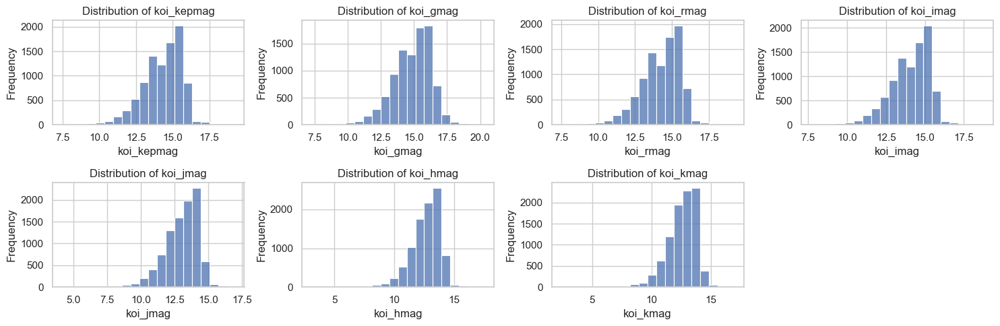

In [23]:
# Plotting the distribution of every wavelength

# Set the seaborn style for better visualization
sns.set(style="whitegrid")

# Set up the figure size
plt.figure(figsize=(15, 5))

# Loop over all 7 columns to plot their distributions
for idx, col in enumerate(df1features.columns):
    plt.subplot(2, 4, idx + 1) 
    sns.histplot(df1features[col], bins=20)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

# Tight layout to ensure plots don't overlap
plt.tight_layout()

We observe a left skewenss in all of the different wavelength bands. Considering that lower magnitudes correspond to brighter stars, while higher magnitudes correspond to
fainter stars means we are more likely to detect brighter stars. Also very faint stars might fall below detection threshold, resulting to the steep right side of the histograms.

In [24]:
# We are interested how the bands affect the outcome so candidate column is not in our interest
# Group data by KOI disposition ('CONFIRMED' and 'FALSE POSITIVE')
confirmed = df1[df1['koi_disposition'] == 'CONFIRMED']
false_positive = df1[df1['koi_disposition'] == 'FALSE POSITIVE']
non_candidate = df1[df1['koi_disposition'] != 'CANDIDATE']

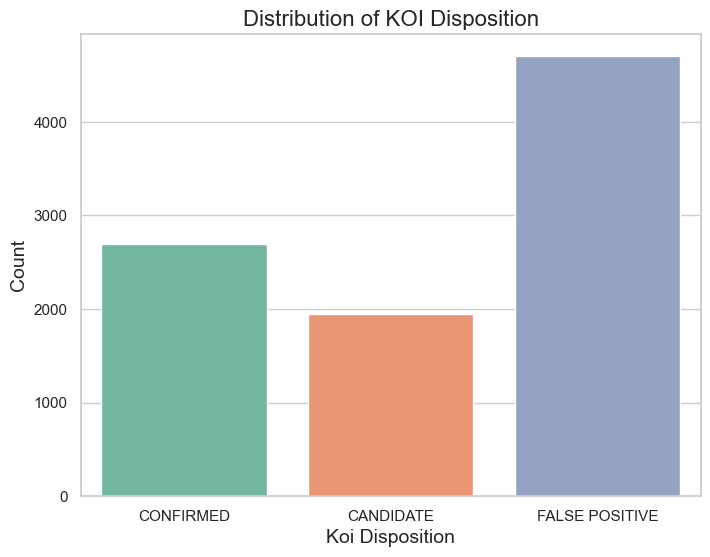

In [25]:
# Plotting the distribution
plt.figure(figsize=(8, 6))

# Plot the distribution of confirmed and false positive KOIs
sns.countplot(x='koi_disposition', data=df1, hue='koi_disposition', palette='Set2', legend=False)

# Adding labels and title
plt.title('Distribution of KOI Disposition', fontsize=16)
plt.xlabel('Koi Disposition', fontsize=14)
plt.ylabel('Count', fontsize=14);

In [26]:
# List of photometric columns 
photometric_columns = ['koi_kepmag','koi_gmag','koi_rmag','koi_imag','koi_jmag','koi_hmag','koi_kmag'] 

In [27]:
# T-tests to compare photometric properties between confirmed and false positives
for col in photometric_columns:
    t_stat, p_val = ttest_ind(confirmed[col], false_positive[col])
    print(f"{col}: t-statistic = {t_stat:.2f}, p-value = {p_val:.4f}")

koi_kepmag: t-statistic = 6.29, p-value = 0.0000
koi_gmag: t-statistic = 7.61, p-value = 0.0000
koi_rmag: t-statistic = 6.15, p-value = 0.0000
koi_imag: t-statistic = 5.51, p-value = 0.0000
koi_jmag: t-statistic = 3.65, p-value = 0.0003
koi_hmag: t-statistic = 2.92, p-value = 0.0035
koi_kmag: t-statistic = 2.88, p-value = 0.0039


The results may be misleading since the confirmed planets are almost half of the false positives, hence imbalanced target, so we repeat with Welch's t-test in favor of the standard

In [28]:
# T-tests to compare photometric properties between confirmed and false positives (using Welch's t-test) for imbalanced data
for col in photometric_columns:
    t_stat, p_val = ttest_ind(confirmed[col], false_positive[col], equal_var=False)
    print(f"{col}: t-statistic = {t_stat:.3f}, p-value = {p_val}")

koi_kepmag: t-statistic = 6.666, p-value = 2.8494315338764016e-11
koi_gmag: t-statistic = 7.984, p-value = 1.6595396854287388e-15
koi_rmag: t-statistic = 6.509, p-value = 8.132282769793052e-11
koi_imag: t-statistic = 5.856, p-value = 4.967492289511676e-09
koi_jmag: t-statistic = 3.902, p-value = 9.635182633368714e-05
koi_hmag: t-statistic = 3.130, p-value = 0.0017557138907164944
koi_kmag: t-statistic = 3.089, p-value = 0.00201713941488606


The results from the t-test indicate brightness of different wavelength bands are significant indicators in differentiating between confirmed planets and false positives.

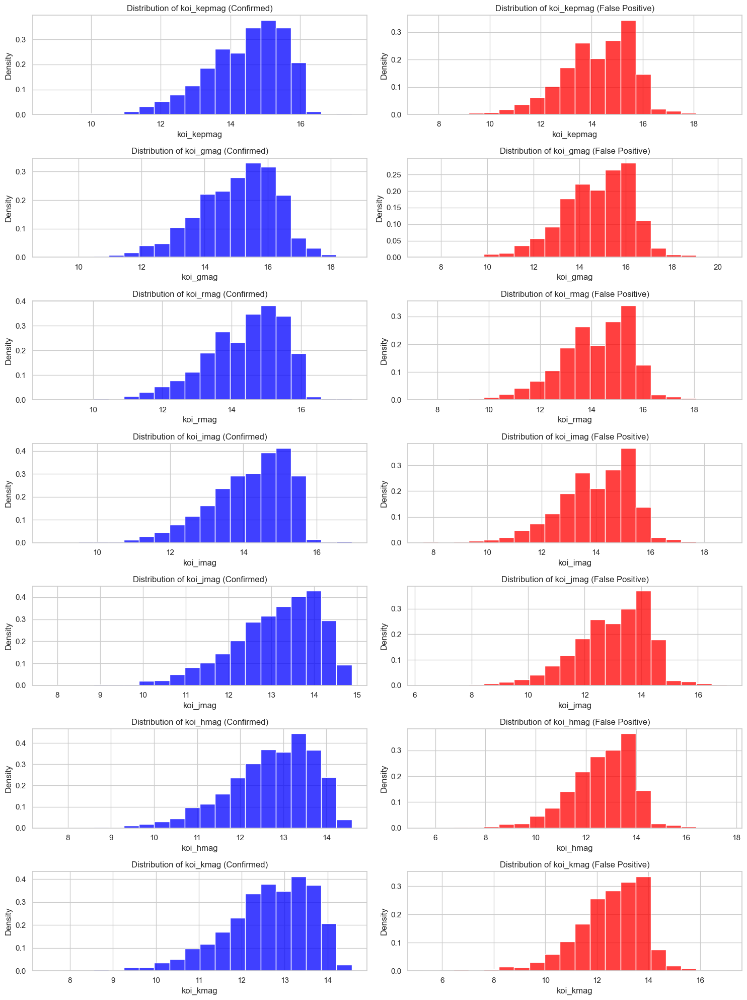

In [29]:
# Set the seaborn style for better visualization
sns.set(style="whitegrid")

# Set up the figure size for the side-by-side histograms
plt.figure(figsize=(15, 20))

# Loop over all photometric columns to plot the distributions side by side
for idx, col in enumerate(df1[photometric_columns].columns):
    plt.subplot(len(photometric_columns), 2, 2 * idx + 1) 
    sns.histplot(confirmed[col], bins=20, color='blue', label='Confirmed', stat='density')
    plt.title(f'Distribution of {col} (Confirmed)')
    plt.xlabel(col)
    plt.ylabel('Density')

    # Plot for false positives
    plt.subplot(len(photometric_columns), 2, 2 * idx + 2) 
    sns.histplot(false_positive[col], bins=20, color='red', label='False Positive', stat='density')
    plt.title(f'Distribution of {col} (False Positive)')
    plt.xlabel(col)
    plt.ylabel('Density')

# Tight layout to ensure plots don't overlap
plt.tight_layout()

We see no clear differentiation in the distribution of Confirmed vs False Positive KOIs, although is noticeable on each band that the Confirmed distribution is more concentrated around the peak, with smaller standard deviation across the values. This might be more visible with boxplots

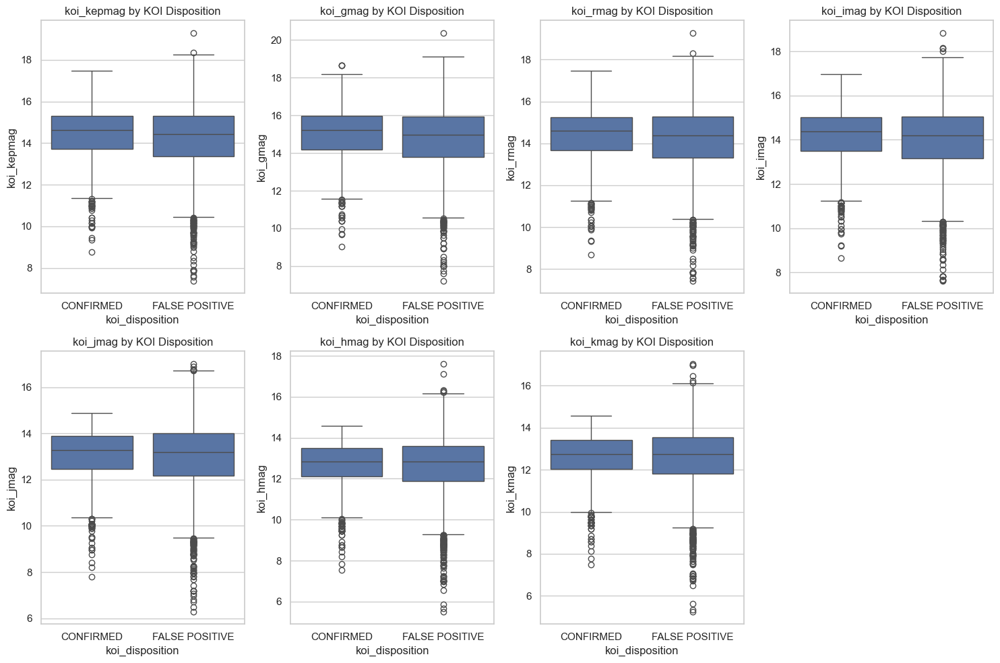

In [30]:
# Visualization: Boxplots for photometric properties
plt.figure(figsize=(15, 10))
for i, col in enumerate(photometric_columns):
    plt.subplot(2, 4, i + 1)
    sns.boxplot(x='koi_disposition', y=col, data=non_candidate)
    plt.title(f'{col} by KOI Disposition')
plt.tight_layout()

Also there is a clear similarity across the wavelengths so we proceed with a correlation matrix.

In [31]:
# Convert the target column 'koi_disposition' to numerical values
disposition_mapping = {'CONFIRMED': 1, 'FALSE POSITIVE': 0, 'CANDIDATE': 2}
df1['koi_disposition'] = df1['koi_disposition'].map(disposition_mapping)

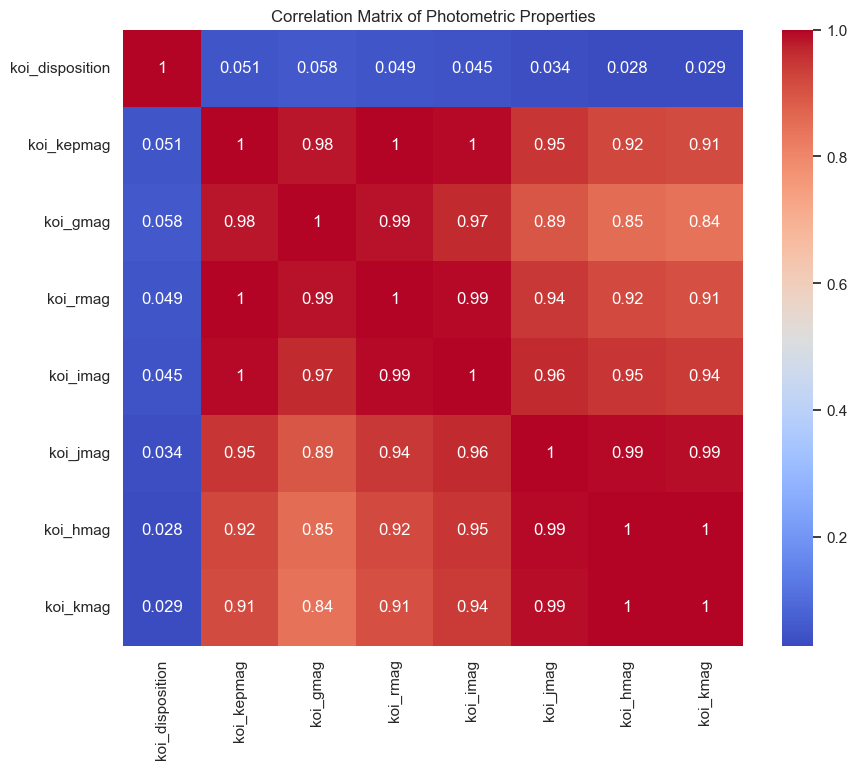

In [32]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df1.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Photometric Properties');

We observe a very high correlation between the different spectra, while close to none correlation with the target variable. So we decide to group some of the spectra with respect to their wavelength or even deriving new columns from them. With the use of PCA we try to solve the multicollinearity and observe clusters differentiating the classifications implying patterns between the variables. 

In [33]:
# Standardize the features before PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df1features)

# Perform PCA to reduce to 2 components
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

In [34]:
# Convert PCA results into a DataFrame for plotting
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df['koi_disposition'] = df1target.replace({0: 'FALSE POSITIVE', 1: 'CONFIRMED', 2: 'CANDIDATE'})

In [35]:
# We deicde to filter the target variable without the candidate classification so is easier to recognise formed clusters
pca_df_filtered = pca_df[pca_df['koi_disposition'] != 'CANDIDATE']

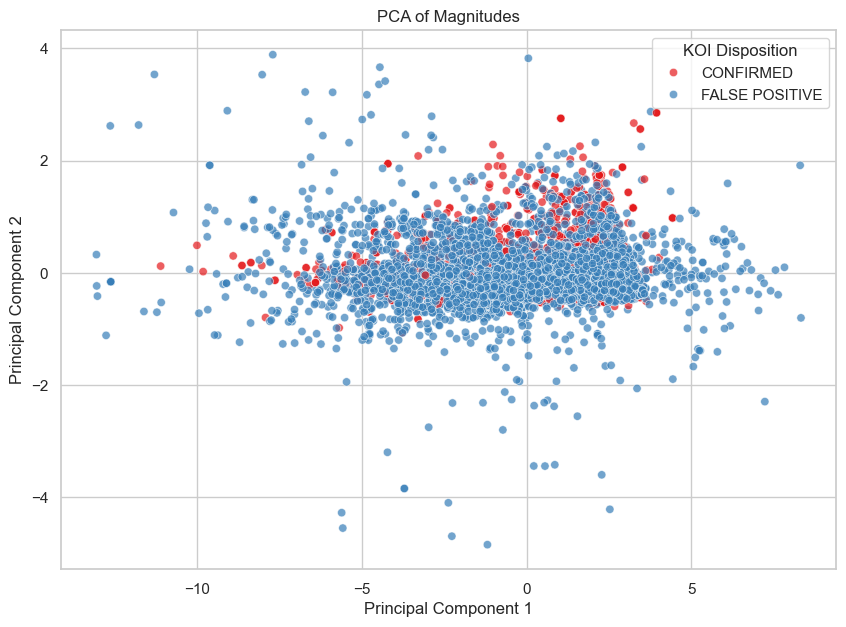

In [36]:
# Plot the PCA results with dispositions
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', hue='koi_disposition', data=pca_df_filtered, palette='Set1',alpha=0.7)

plt.title('PCA of Magnitudes')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='KOI Disposition');

In [37]:
# Deriving new coloumns from the features and repeating the process to try find any clusters

In [38]:
# Define groups based on wavelength proximity
visible_bands = ['koi_gmag', 'koi_rmag', 'koi_imag']
infrared_bands = ['koi_jmag', 'koi_hmag', 'koi_kmag']
all_bands = ['koi_kepmag','koi_gmag', 'koi_rmag', 'koi_imag','koi_jmag', 'koi_hmag', 'koi_kmag']

In [39]:
# Create new features (feature engineering)
df1['mean_visible_mag'] = df1[visible_bands].mean(axis=1)
df1['mean_infrared_mag'] = df1[infrared_bands].mean(axis=1)
df1['visible_infrared_diff'] = df1['mean_visible_mag'] - df1['mean_infrared_mag']
df1['optimized_mag'] = df1['koi_kepmag']
df1['g_r_diff'] = df1['koi_gmag'] - df1['koi_rmag']
df1['r_i_diff'] = df1['koi_rmag'] - df1['koi_imag']
df1['j_h_diff'] = df1['koi_jmag'] - df1['koi_hmag']
df1['h_k_diff'] = df1['koi_hmag'] - df1['koi_kmag']

In [40]:
# Drop original magnitude columns
df1.drop(columns=all_bands, inplace=True)

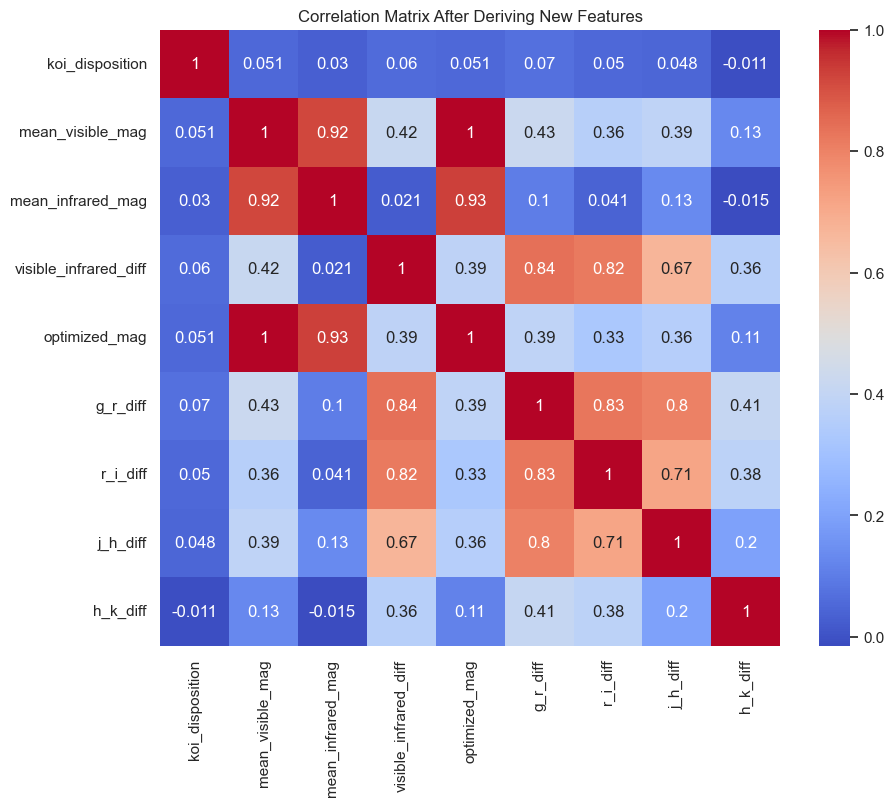

In [41]:
# Correlation heatmap with new features
plt.figure(figsize=(10, 8))
sns.heatmap(df1.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix After Deriving New Features');

In [42]:
# Features for PCA
pca_features = ['mean_visible_mag', 'mean_infrared_mag', 'visible_infrared_diff', 'optimized_mag','g_r_diff','r_i_diff','j_h_diff','h_k_diff']
# Standardize the features before PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df1[pca_features])

In [43]:
# Perform PCA to reduce to 2 components
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Convert PCA results into a DataFrame for plotting
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df['koi_disposition'] = df1['koi_disposition'].replace({0: 'FALSE POSITIVE', 1: 'CONFIRMED', 2: 'CANDIDATE'})

In [44]:
# We deicde to filter the target variable without the candidate classification so is easier to recognise formed clusters
pca_df_filtered = pca_df[pca_df['koi_disposition'] != 'CANDIDATE']

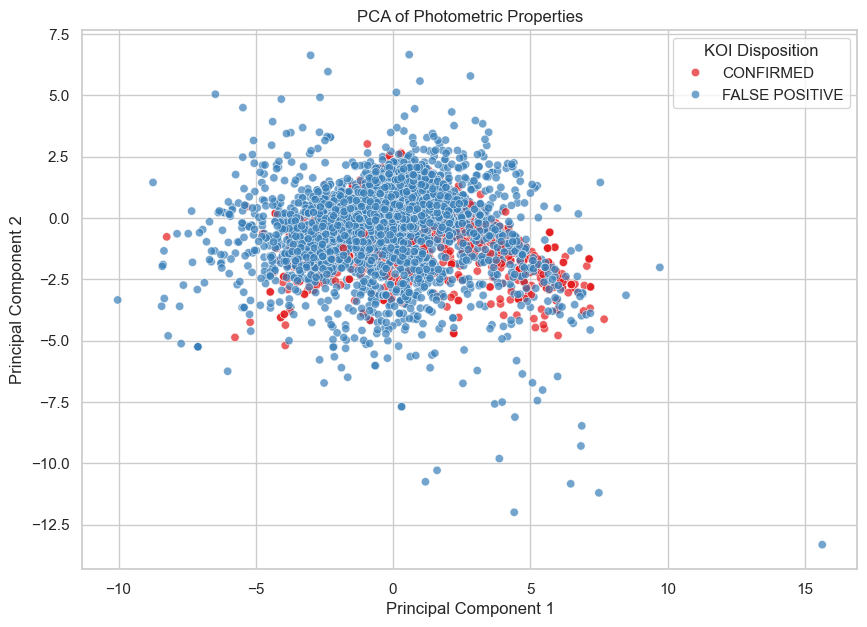

In [45]:
# Plot the PCA results with dispositions
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', hue='koi_disposition', data=pca_df_filtered, palette='Set1',alpha=0.7)

plt.title('PCA of Photometric Properties')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='KOI Disposition');

Even with the newly derived features, there is no clear separation between classifications

While we see some better results towards the visible wavelength bands, giving more credibility to the optimized koi_kepmag wavelength as it is very correlated to the koi_rmag band that is the red light spectra, there is no big separation across them, suggesting no big benefits from focusing the research regions towards a certain wavelength band.

## Question 2: Most influencial columns to the likelihood of exoplanet confirmation

In [46]:
df2=df.copy()

In [47]:
df2.head()

,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_time0bk,koi_time0,koi_eccen,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_insol,koi_dor,koi_ldm_coeff4,koi_ldm_coeff3,koi_ldm_coeff2,koi_ldm_coeff1,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_tce_plnt_num,koi_quarters,koi_bin_oedp_sig,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag
0,CONFIRMED,CANDIDATE,1.000,0,0,0,0,9.488036,170.538750,2455003.539,0.0,0.146,2.95750,615.8,0.022344,3.20796,2.26,0.0853,89.66,793.0,93.59,24.810,0.0,0.0,0.2291,0.4603,5.135849,28.470820,35.8,2,142.0,1.0,11111111111111111000000000000000,0.6864,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347,15.890,15.270,15.114,15.006,14.082,13.751,13.648
1,CONFIRMED,CANDIDATE,0.969,0,0,0,0,54.418383,162.513840,2454995.514,0.0,0.586,4.50700,874.8,0.027954,3.02368,2.83,0.2734,89.57,443.0,9.11,77.900,0.0,0.0,0.2291,0.4603,7.027669,20.109507,25.8,2,25.0,2.0,11111111111111111000000000000000,0.0023,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347,15.890,15.270,15.114,15.006,14.082,13.751,13.648
2,CANDIDATE,CANDIDATE,0.000,0,0,0,0,19.899140,175.850252,2455008.850,0.0,0.969,1.78220,10829.0,0.154046,7.29555,14.60,0.1419,88.96,638.0,39.30,53.500,0.0,0.0,0.2711,0.3858,37.159767,187.449100,76.3,1,56.0,1.0,11111101110111011000000000000000,0.6624,5853.0,4.544,-0.18,0.868,0.961,297.00482,48.134129,15.436,15.943,15.390,15.220,15.166,14.254,13.900,13.826
3,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,1.736952,170.307565,2455003.308,0.0,1.276,2.40641,8079.2,0.387394,0.22080,33.46,0.0267,67.09,1395.0,891.96,3.278,0.0,0.0,0.2865,0.3556,39.066550,541.895100,505.6,1,621.0,1.0,11111110111011101000000000000000,0.0000,5805.0,4.564,-0.52,0.791,0.836,285.53461,48.285210,15.597,16.100,15.554,15.382,15.266,14.326,13.911,13.809
4,CONFIRMED,CANDIDATE,1.000,0,0,0,0,2.525592,171.595550,2455004.596,0.0,0.701,1.65450,603.3,0.024064,1.98635,2.75,0.0374,85.41,1406.0,926.16,8.750,0.0,0.0,0.2844,0.3661,4.749945,33.191900,40.9,1,515.0,1.0,01111111111111111000000000000000,0.3090,6031.0,4.438,0.07,1.046,1.095,288.75488,48.226200,15.509,16.015,15.468,15.292,15.241,14.366,14.064,13.952


Main target for this question is to find the features that impact the most the confirmation of our target variable. So we focus on the final classification column
of the dataset and drop any confidence scores columns. From the KIC parameters investigated before we are only using the optimized wavelength band of koi_kepmag and the celestial coordinates of the star.

In [48]:
# Dropping the different wavelength bands
df2.drop(['koi_gmag','koi_rmag','koi_imag','koi_zmag','koi_jmag','koi_hmag','koi_kmag'], axis=1, inplace=True)

In [49]:
# Dropping the other target columns or confidence columns as they are not features. Also koi_quarters because it only indicates which part of the transit was searched
df2.drop(['koi_pdisposition','koi_score','koi_bin_oedp_sig','koi_quarters'], axis=1, inplace=True)

In [50]:
# Handling missing values
df2.isnull().sum()

koi_disposition        0
koi_fpflag_nt          0
koi_fpflag_ss          0
koi_fpflag_co          0
koi_fpflag_ec          0
koi_period             0
koi_time0bk            0
koi_time0              0
koi_eccen            363
koi_impact           363
koi_duration           0
koi_depth            363
koi_ror              363
koi_srho             321
koi_prad             363
koi_sma              363
koi_incl             364
koi_teq              363
koi_insol            321
koi_dor              363
koi_ldm_coeff4       363
koi_ldm_coeff3       363
koi_ldm_coeff2       363
koi_ldm_coeff1       363
koi_max_sngle_ev    1142
koi_max_mult_ev     1142
koi_model_snr        363
koi_count              0
koi_num_transits    1142
koi_tce_plnt_num     346
koi_steff            363
koi_slogg            363
koi_smet             386
koi_srad             363
koi_smass            363
ra                     0
dec                    0
koi_kepmag             1
dtype: int64

In [51]:
# Getting a brief description for the 3 columns with more than 1k missing values (more than 10% of the whole dataset rows)

koi_max_sngle_ev: This represents the maximum calculated value of the Single Event Statistic (SES) for a given candidate transit-like signal.The SES measures how likely a single observed event is a true planetary transit signal as opposed to random noise.

koi_max_mult_ev: This value represents the Maximum Multiple Event Statistic (MES), which measures the signal-to-noise ratio of repeated transit-like signals across different trial periods and phases. The MES identifies the likelihood of a candidate's signal being genuine.

koi_num_transits: This variable represents the expected number of transit events (or partially observed transits) associated with the candidate planet's transit signals. This value excludes transits that entirely fall within gaps in observational data.

In [52]:
# Most likely reasons for the missing values are:
# 1) Signals too weak or absent or even below the threshold (7.1σ) set by the analysis pipeline. (These criteria dont apply for koi_num_transits)
# 2) Transit might fall within observational gaps or have too few transits that may not be counted (Criteria only for koi_num_transits)

So we decide that the koi_model_snr variable that indicates the transit signal to noise ratio is far more important for this analysis, as it holds information if the signal is too weak to collect or not. If the signal is just too weak, best way to handle the missing values is by imputing with 0, otherwise a different method of imputation.

In [53]:
# Removing all the koi_model_snr rows since is the main signal indicator for many variables
df2.dropna(subset=['koi_model_snr'], inplace=True)

Investigating koi_model_snr nature and then comparing if the missing values from the max single and multiple events are related to low signals so we can impute with 0

In [54]:
# Note: If koi_model_snr value is high indicates a strong and reliable signal that stands out clearly against the noise in the light curve data

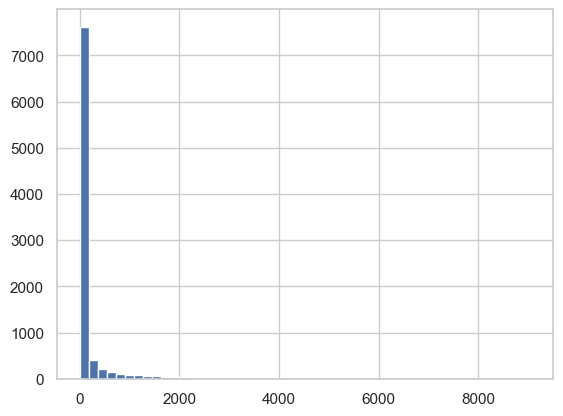

In [55]:
# Distribution of koi_model_snr 
plt.hist(df2['koi_model_snr'],50);

In [56]:
# Filter rows where koi_max_sngle_ev is missing
missing_sngle_ev = df2[df2['koi_max_sngle_ev'].isna()]['koi_model_snr']

# Filter rows where koi_max_mult_ev is missing
missing_mult_ev = df2[df2['koi_max_mult_ev'].isna()]['koi_model_snr']

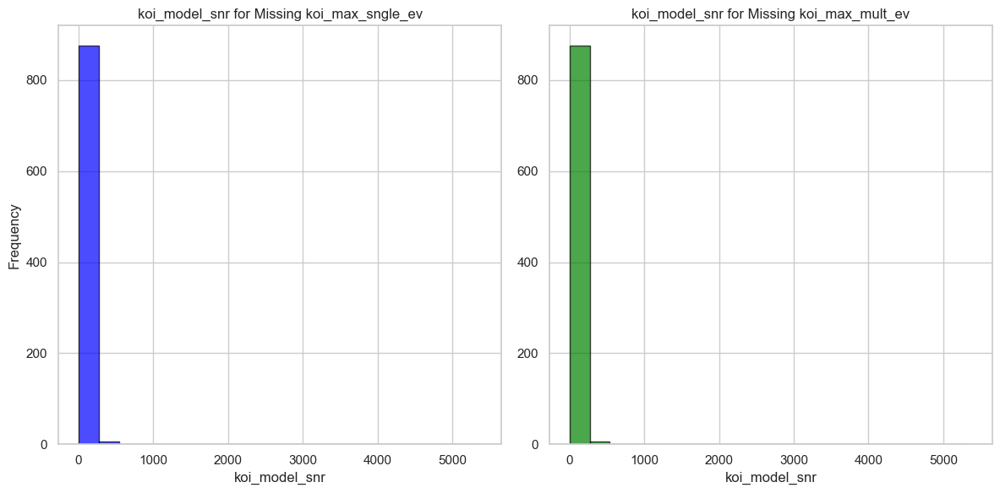

In [57]:
# Distribution of snr values corresponding to koi_max_sngle_ev and koi_max_mult_ev missing values

# Create subplots for the histograms
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Histogram for koi_max_sngle_ev missing
axes[0].hist(missing_sngle_ev, bins=20, color='blue', edgecolor='black', alpha=0.7)
axes[0].set_title('koi_model_snr for Missing koi_max_sngle_ev')
axes[0].set_xlabel('koi_model_snr')
axes[0].set_ylabel('Frequency')

# Histogram for koi_max_mult_ev missing
axes[1].hist(missing_mult_ev, bins=20, color='green', edgecolor='black', alpha=0.7)
axes[1].set_title('koi_model_snr for Missing koi_max_mult_ev')
axes[1].set_xlabel('koi_model_snr')

# Adjust layout and show the plot
plt.tight_layout()

As we can see the majority of the values are near 0 so imputing with 0 on both columns is recommended

In [58]:
# Impute missing values in koi_max_sngle_ev with 0
df2['koi_max_sngle_ev']=df2['koi_max_sngle_ev'].fillna(0)

# Impute missing values in koi_max_mult_ev with 0
df2['koi_max_mult_ev']=df2['koi_max_mult_ev'].fillna(0)

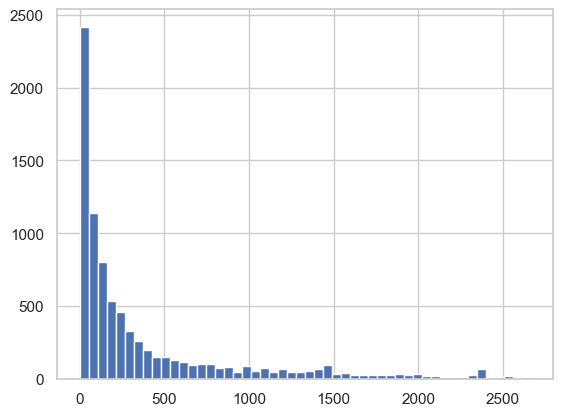

In [59]:
plt.hist(df2['koi_num_transits'],50);

Since the missing koi_num_transits can be either very few transits or observational gaps and there is a big correlation of the missing values with the other 2 columns that we examined and after watching the distribution of the variable, we decide to also impute with 0

In [60]:
# Impute missing values in koi_num_transits with 0
df2['koi_num_transits']=df2['koi_num_transits'].fillna(0)

In [61]:
df2.isnull().sum()

koi_disposition       0
koi_fpflag_nt         0
koi_fpflag_ss         0
koi_fpflag_co         0
koi_fpflag_ec         0
koi_period            0
koi_time0bk           0
koi_time0             0
koi_eccen             0
koi_impact            0
koi_duration          0
koi_depth             0
koi_ror               0
koi_srho              0
koi_prad              0
koi_sma               0
koi_incl              1
koi_teq               0
koi_insol             0
koi_dor               0
koi_ldm_coeff4        0
koi_ldm_coeff3        0
koi_ldm_coeff2        0
koi_ldm_coeff1        0
koi_max_sngle_ev      0
koi_max_mult_ev       0
koi_model_snr         0
koi_count             0
koi_num_transits      0
koi_tce_plnt_num    255
koi_steff             0
koi_slogg             0
koi_smet             23
koi_srad              0
koi_smass             0
ra                    0
dec                   0
koi_kepmag            1
dtype: int64

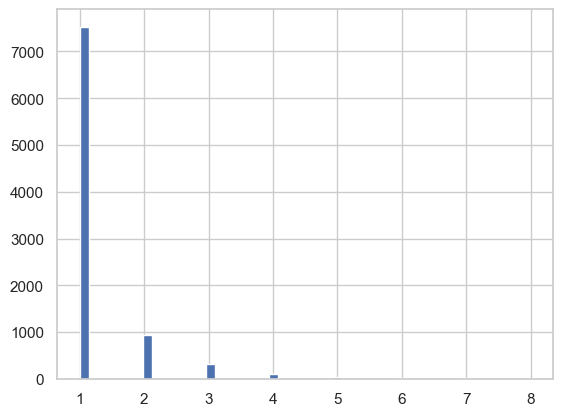

In [62]:
plt.hist(df2['koi_tce_plnt_num'],50);

In [63]:
# Filter rows where koi_tce_plnt_num is missing
missing_tce_plnt_num = df2[df2['koi_tce_plnt_num'].isna()]

# Get the distribution of koi_disposition for missing koi_tce_plnt_num
missing_disposition_distribution = missing_tce_plnt_num['koi_disposition'].value_counts()

In [64]:
# Get the distribution of koi_disposition
overall_disposition_distribution = df2['koi_disposition'].value_counts()

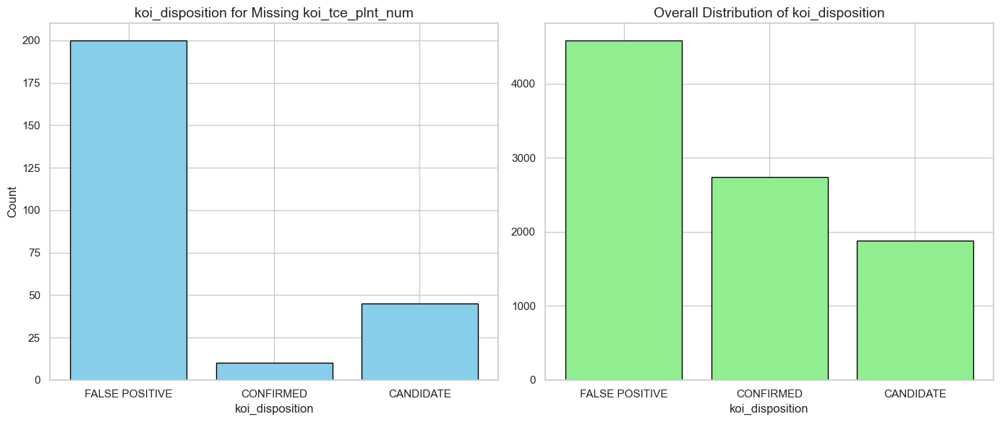

In [65]:
# Ensure consistent order of classes
disposition_order = overall_disposition_distribution.index  # Use the overall distribution order
# Side by side comparisson is gonna help see if the distribution keeps the same shape, meaning there is no bias

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot for missing koi_tce_plnt_num
axes[0].bar(disposition_order, missing_disposition_distribution.reindex(disposition_order, fill_value=0).values, 
            color='skyblue', edgecolor='black')
axes[0].set_title('koi_disposition for Missing koi_tce_plnt_num', fontsize=14)
axes[0].set_xlabel('koi_disposition', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].tick_params(axis='x', rotation=0)

# Plot for overall distribution
axes[1].bar(disposition_order, overall_disposition_distribution.values, 
            color='lightgreen', edgecolor='black')
axes[1].set_title('Overall Distribution of koi_disposition', fontsize=14)
axes[1].set_xlabel('koi_disposition', fontsize=12)
axes[1].tick_params(axis='x', rotation=0)

# Adjust layout and show the plot
plt.tight_layout()

We can observe an association of the missing koi_tce_plnt_num values with higher false positive ratio, indicating that this metric can be crucial for confirming an exoplanet

In [66]:
# So by imputing with 0 is gonna give the logical bias that we see in the dataset
# Impute missing values in koi_tce_plnt_num with 0
df2['koi_tce_plnt_num']=df2['koi_tce_plnt_num'].fillna(0)

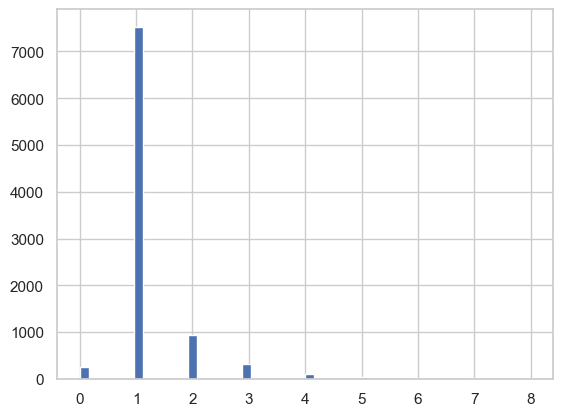

In [67]:
plt.hist(df2['koi_tce_plnt_num'],50);

In [68]:
# Dropping the very few random missing values
df2=df2.dropna()

In [69]:
# Separate candidates from the rest of the dataset
candidates = df2[df2['koi_disposition'] == 'CANDIDATE']
non_candidates = df2[df2['koi_disposition'].isin(['CONFIRMED', 'FALSE POSITIVE'])]

In [70]:
non_candidates = non_candidates.copy() # This helps prevent python warnings from popping up
non_candidates.loc[:, 'confirmed'] = non_candidates['koi_disposition'].map({'CONFIRMED': 1, 'FALSE POSITIVE': 0})

In [71]:
# Drop unnecessary columns
columns_to_drop = ['koi_disposition']
non_candidates = non_candidates.drop(columns=columns_to_drop)

In [72]:
# Split non-candidates into features (X) and target (y)
X = non_candidates.drop('confirmed', axis=1)
y = non_candidates['confirmed']

In [73]:
# Initialize the Random Forest Classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)

In [74]:
# Perform 5-fold cross-validation for ensuring the model does not overfit
cv_scores = cross_val_score(rf, X, y, cv=5, scoring='accuracy')

In [75]:
# Display the cross-validation scores and mean accuracy
print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", np.mean(cv_scores))

Cross-validation scores: [0.99178645 0.99452055 0.99452055 0.99452055 0.97808219]
Mean cross-validation score: 0.9906860566510083


In [76]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [77]:
# Fit the model
rf.fit(X_train, y_train)

# Predict on the test set
y_pred = rf.predict(X_test)

In [78]:
# Evaluate model performance
print("Accuracy on Test Set:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy on Test Set: 0.9931553730321697

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99       904
           1       1.00      0.98      0.99       557

    accuracy                           0.99      1461
   macro avg       0.99      0.99      0.99      1461
weighted avg       0.99      0.99      0.99      1461



That is a very high accuracy score. Could be due to Random Forests robustness in outliers as well

In [79]:
# Get feature importances from the model
importances = rf.feature_importances_
feature_names = X.columns

In [80]:
# Create a DataFrame for feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort the DataFrame by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

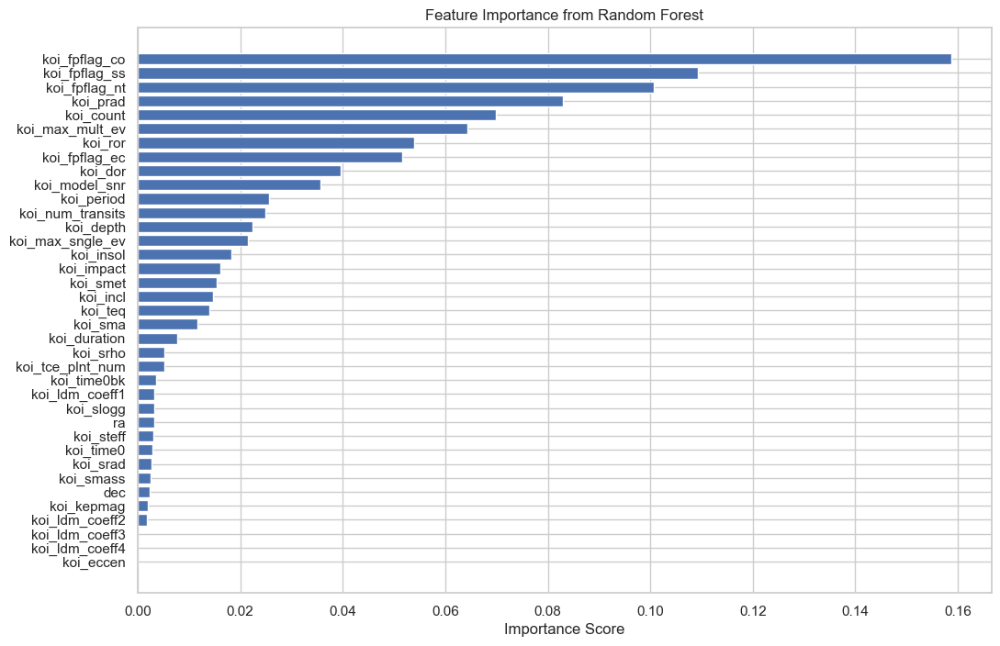

In [81]:
# Plot the feature importance from Random Forest
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance Score')
plt.title('Feature Importance from Random Forest')
plt.gca().invert_yaxis()  # Inverting the axis to for better visualization

In [82]:
# Display the top 10 most important features
print("\nTop 10 Most Important Features:")
feature_importance_df.head(10)


Top 10 Most Important Features:


,Feature,Importance
2,koi_fpflag_co,0.158665
1,koi_fpflag_ss,0.109215
0,koi_fpflag_nt,0.100660
13,koi_prad,0.082957
26,koi_count,0.069923
24,koi_max_mult_ev,0.064382
11,koi_ror,0.053878
3,koi_fpflag_ec,0.051606
18,koi_dor,0.039658
25,koi_model_snr,0.035651


In [83]:
# Save top 10 important features
top_10_features = feature_importance_df.head(10)

In [84]:
# Perform PCA to reduce features to 2 dimensions
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

In [85]:
# Perform t-SNE to reduce features to 2 dimensions (more resilient to outliers, takes more time tho)
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

In [86]:
# Map the y values back to labels for plotting
y_labels = y.map({1: 'Confirmed', 0: 'False Positive'})

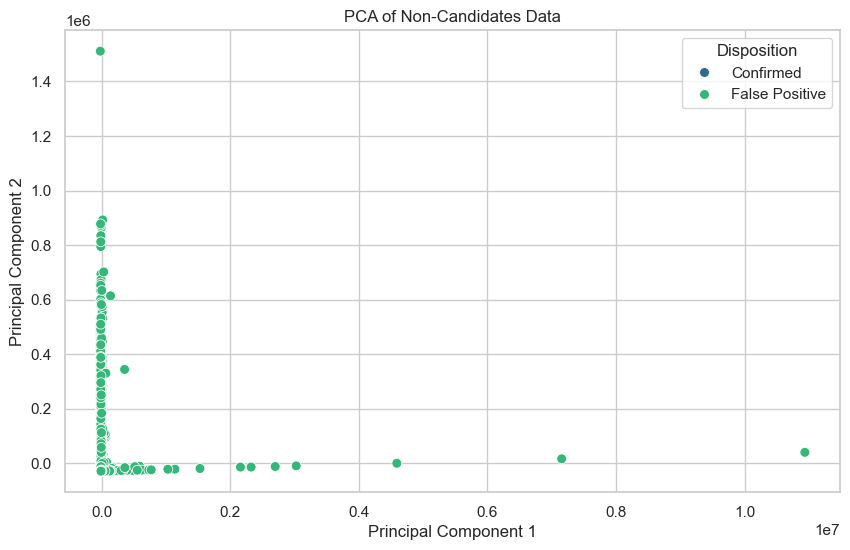

In [87]:
# PCA Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=y_labels, palette='viridis', s=50)
plt.title('PCA of Non-Candidates Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Disposition', loc='best')
plt.grid(True)

PCA plot is not giving any insights, probably due to some outliers we opt not remove, so we apply t-SNE dimensionality reduction

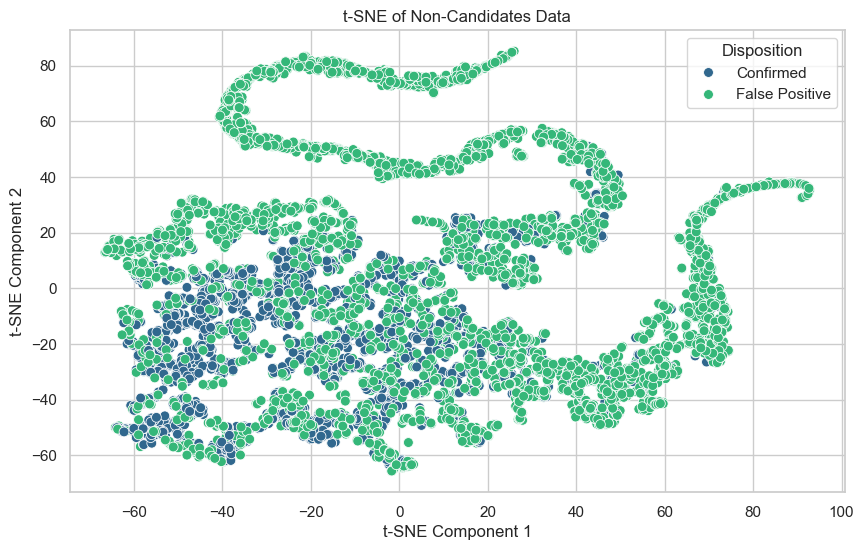

In [88]:
# t-SNE Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=y_labels, palette='viridis', s=50)
plt.title('t-SNE of Non-Candidates Data')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Disposition', loc='best')
plt.grid(True)

From the above t-SNE graph since the PCA was not very helpful we can see that classified planets closer to the cluster between (-60,-60) and (0,0) tend to have a higher confirmation rate, while the plantes that correspond to the rest, more deviated points have a much higher false positive classification.

In [89]:
# Apply t-SNE to 3 components
tsne = TSNE(n_components=3, random_state=42)
tsne_result = tsne.fit_transform(X)

In [90]:
# Add t-SNE components to the non_candidates DataFrame
non_candidates['tSNE1'] = tsne_result[:, 0]
non_candidates['tSNE2'] = tsne_result[:, 1]
non_candidates['tSNE3'] = tsne_result[:, 2]
non_candidates['label'] = y_labels

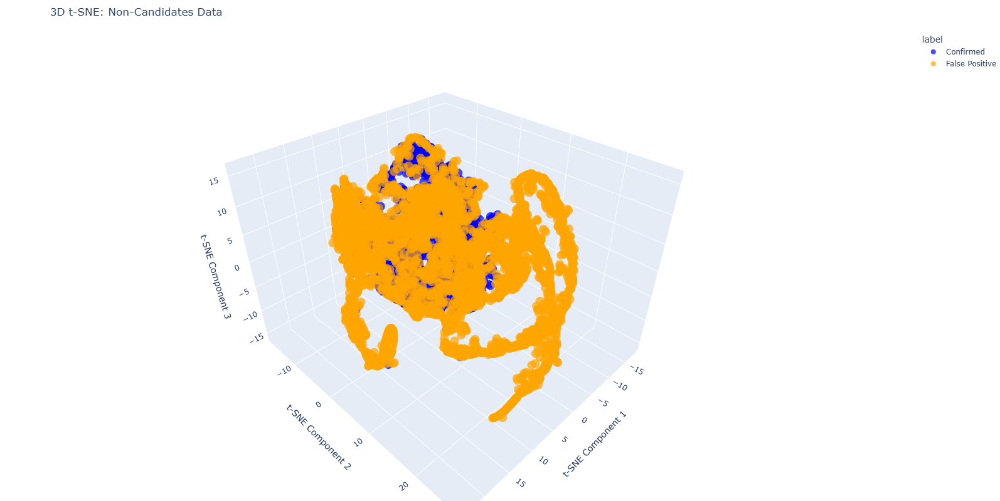

In [91]:
# Plot 3D t-SNE Results with Plotly
fig = px.scatter_3d(non_candidates, x='tSNE1', y='tSNE2', z='tSNE3', color='label',
                    color_discrete_map={'Confirmed': 'blue', 'False Positive': 'orange'},
                    title='3D t-SNE: Non-Candidates Data',
                    labels={'tSNE1': 't-SNE Component 1', 'tSNE2': 't-SNE Component 2', 'tSNE3': 't-SNE Component 3'},
                    opacity=0.7)

# Expand the figure size
fig.update_layout(width=1200, height=800, 
                  scene=dict(xaxis_title='t-SNE Component 1',yaxis_title='t-SNE Component 2',zaxis_title='t-SNE Component 3'), 
                  margin=dict(l=0, r=0, b=0, t=50))
fig.show()

In [92]:
# Interactive graph non-visible in the pdf notebook for some reason. I will include a screenshot in the report

In [93]:
# Extract top 10 features based on importance
top_10_features = feature_importance_df.head(10)['Feature']

# Filter the dataset using the top 10 important features
X_top_10 = non_candidates[top_10_features]

In [94]:
# Split the dataset into features (X_top_10) and target (y)
y = non_candidates['confirmed']

In [95]:
# Train a new Random Forest model with top 10 features
rf_top = RandomForestClassifier(n_estimators=100, random_state=42)

In [96]:
# Perform 5-fold cross-validation using top 10 features ensuring again the model does not overfit
cv_scores = cross_val_score(rf_top, X_top_10, y, cv=5, scoring='accuracy')
print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score with top 10 features:", np.mean(cv_scores))

Cross-validation scores: [0.99247091 0.99726027 0.99657534 0.99726027 0.98767123]
Mean cross-validation score with top 10 features: 0.9942476067246115


In [97]:
# Split the dataset into training and testing sets using top 10 features
X_train, X_test, y_train, y_test = train_test_split(X_top_10, y, test_size=0.2, random_state=42)

In [98]:
# Fit the model using top 10 features
rf_top.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_top.predict(X_test)

In [99]:
# Evaluate model performance using top 10 features
print("Accuracy on Test Set with top 10 features:", accuracy_score(y_test, y_pred))
print("\nClassification Report with top 10 features:\n", classification_report(y_test, y_pred))

Accuracy on Test Set with top 10 features: 0.9952087611225188

Classification Report with top 10 features:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       904
           1       1.00      0.99      0.99       557

    accuracy                           1.00      1461
   macro avg       1.00      0.99      0.99      1461
weighted avg       1.00      1.00      1.00      1461



Accuracy of model suprisingly even higher

In [100]:
# Apply t-SNE to 3 components with top 10 features
tsne = TSNE(n_components=3, random_state=42)
tsne_result = tsne.fit_transform(X_top_10)

In [101]:
# Add t-SNE components to the non_candidates DataFrame
non_candidates['tSNE1'] = tsne_result[:, 0]
non_candidates['tSNE2'] = tsne_result[:, 1]
non_candidates['tSNE3'] = tsne_result[:, 2]
non_candidates['label'] = y_labels

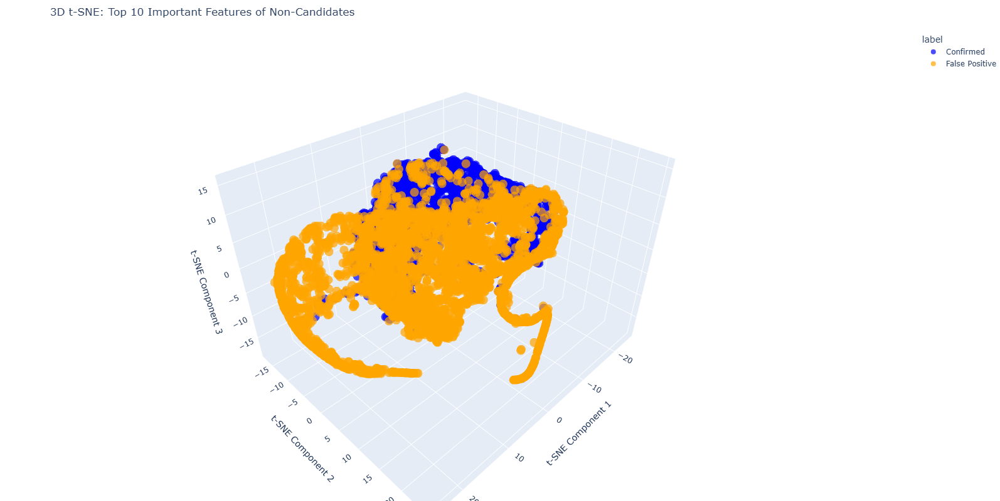

In [102]:
# Plot 3D t-SNE Results with Plotly
fig = px.scatter_3d(non_candidates, x='tSNE1', y='tSNE2', z='tSNE3', color='label',
                    color_discrete_map={'Confirmed': 'blue', 'False Positive': 'orange'},
                    title='3D t-SNE: Top 10 Important Features of Non-Candidates',
                    labels={'tSNE1': 't-SNE Component 1', 'tSNE2': 't-SNE Component 2', 'tSNE3': 't-SNE Component 3'},
                    opacity=0.7)

# Expand the figure size
fig.update_layout(width=1200, height=800, 
                  scene=dict(xaxis_title='t-SNE Component 1',yaxis_title='t-SNE Component 2',zaxis_title='t-SNE Component 3'),
                  margin=dict(l=0, r=0, b=0, t=50))
fig.show()

Although the separation is a little better, repeating with 5-8 features could be worth trying.

## Question 3: Can we identify clusters of KOI's based on physical and orbital characteristics

In [103]:
# Columns to further analyze related with physical and orbital charecteristics grouped by planetary and stellar variables
planetary_variables=['koi_period','koi_time0bk','koi_time0','koi_eccen','koi_impact','koi_duration','koi_depth','koi_ror',
                     'koi_prad','koi_sma','koi_incl','koi_teq','koi_insol','koi_dor']
stellar_variables=['koi_steff','koi_slogg','koi_smet','koi_srad','koi_smass','ra','dec','koi_kepmag']

In [104]:
# Adding the target column as well
df3=df.copy()
df3=df3[['koi_disposition']+planetary_variables+stellar_variables]

In [105]:
# Checking we have the dataframe we want
df3.head()

,koi_disposition,koi_period,koi_time0bk,koi_time0,koi_eccen,koi_impact,koi_duration,koi_depth,koi_ror,koi_prad,koi_sma,koi_incl,koi_teq,koi_insol,koi_dor,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag
0,CONFIRMED,9.488036,170.538750,2455003.539,0.0,0.146,2.95750,615.8,0.022344,2.26,0.0853,89.66,793.0,93.59,24.810,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347
1,CONFIRMED,54.418383,162.513840,2454995.514,0.0,0.586,4.50700,874.8,0.027954,2.83,0.2734,89.57,443.0,9.11,77.900,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347
2,CANDIDATE,19.899140,175.850252,2455008.850,0.0,0.969,1.78220,10829.0,0.154046,14.60,0.1419,88.96,638.0,39.30,53.500,5853.0,4.544,-0.18,0.868,0.961,297.00482,48.134129,15.436
3,FALSE POSITIVE,1.736952,170.307565,2455003.308,0.0,1.276,2.40641,8079.2,0.387394,33.46,0.0267,67.09,1395.0,891.96,3.278,5805.0,4.564,-0.52,0.791,0.836,285.53461,48.285210,15.597
4,CONFIRMED,2.525592,171.595550,2455004.596,0.0,0.701,1.65450,603.3,0.024064,2.75,0.0374,85.41,1406.0,926.16,8.750,6031.0,4.438,0.07,1.046,1.095,288.75488,48.226200,15.509


In [106]:
# Checking for null values
df3.isnull().sum()

koi_disposition      0
koi_period           0
koi_time0bk          0
koi_time0            0
koi_eccen          363
koi_impact         363
koi_duration         0
koi_depth          363
koi_ror            363
koi_prad           363
koi_sma            363
koi_incl           364
koi_teq            363
koi_insol          321
koi_dor            363
koi_steff          363
koi_slogg          363
koi_smet           386
koi_srad           363
koi_smass          363
ra                   0
dec                  0
koi_kepmag           1
dtype: int64

Most common missing value is 363 and since all those features are planetary and stellar characteristics we choose to tag these rows with an indicator and investigate more

In [107]:
# Create a binary flag for missing koi_eccen (anticipating the same results as with the other columns with 363 missing values)
df3['koi_eccen_missing'] = df3['koi_eccen'].isna().astype(int)

In [108]:
# Split the data into flagged (missing) and non-flagged (non-missing) datasets
missing_data = df3[df3['koi_eccen_missing'] == 1]
non_missing_data = df3[df3['koi_eccen_missing'] == 0]

In [109]:
# Calculate koi_disposition distributions for both datasets
missing_disposition = missing_data['koi_disposition'].value_counts()
non_missing_disposition = non_missing_data['koi_disposition'].value_counts()

In [110]:
# Get the distribution of koi_disposition
overall_disposition_distribution = df3['koi_disposition'].value_counts()
# Ensure consistent order of classes
disposition_order = overall_disposition_distribution.index  # Use the overall distribution order

In [111]:
# Reindex the distributions to have the same order
missing_disposition = missing_disposition.reindex(disposition_order, fill_value=0)
non_missing_disposition = non_missing_disposition.reindex(disposition_order, fill_value=0)

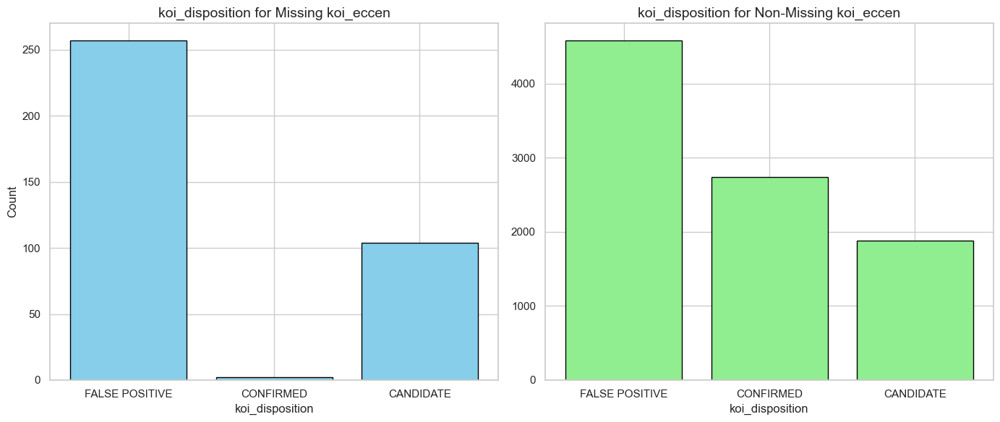

In [112]:
# Create side-by-side bar plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
# Side by side again will give us a better view of any bias towards the missing values

# Plot for missing koi_eccen
axes[0].bar(missing_disposition.index, missing_disposition.values, color='skyblue', edgecolor='black')
axes[0].set_title('koi_disposition for Missing koi_eccen', fontsize=14)
axes[0].set_xlabel('koi_disposition', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].tick_params(axis='x', rotation=0)

# Plot for non-missing koi_eccen
axes[1].bar(non_missing_disposition.index, non_missing_disposition.values, color='lightgreen', edgecolor='black')
axes[1].set_title('koi_disposition for Non-Missing koi_eccen', fontsize=14)
axes[1].set_xlabel('koi_disposition', fontsize=12)
axes[1].tick_params(axis='x', rotation=0)

# Adjust layout, no overlapping
plt.tight_layout()

We observe a big bias towards the false positive classification. Since we are examining if we can form clusters of koi's with similar characteristics, we can not impute those values with mean values or zero so we opt to drop them. Also from what we saw from the analysis on the previous question is that the missing values are fully depended on the signal to noise ratio column.

In [113]:
# Dropping the missing values from the columns of interest
df3=df3.dropna()

In [114]:
# Keep only 'CONFIRMED' and 'FALSE POSITIVE'
df3 = df3.loc[df3['koi_disposition'] != 'CANDIDATE']

Dropping the outliers this time to be able to get some insights from the more time-efficient PCA (compared to t-SNE)

In [115]:
# Define the lower and upper quantiles
lower_quantile = 0.01
upper_quantile = 0.99

# Iterate through each numerical feature and remove outliers (all features left are numrical)
for col in planetary_variables + stellar_variables:
    lower_bound = df3[col].quantile(lower_quantile)
    upper_bound = df3[col].quantile(upper_quantile)
    df3 = df3.loc[(df3[col] >= lower_bound) & (df3[col] <= upper_bound)]

In [116]:
# Extract features for clustering
X = df3[planetary_variables + stellar_variables]

In [117]:
# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [118]:
# Running different values for clusters for plotting the elbow method
inertia = []
cluster_range = range(1, 11)

for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

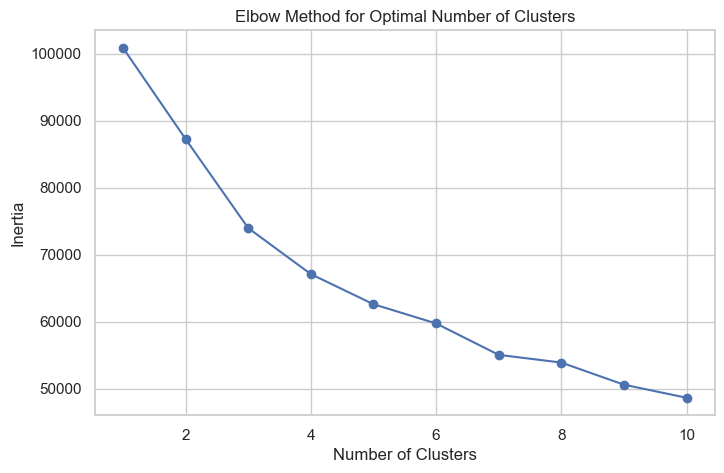

In [119]:
# Plot the Elbow Method to determine cluster number
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters');

From the above graph we choose 7 as the best number of clusters since the curve is flattened after that point

In [120]:
# Initiate k-means clustering with 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42)
df3['Cluster'] = kmeans.fit_predict(X_scaled)

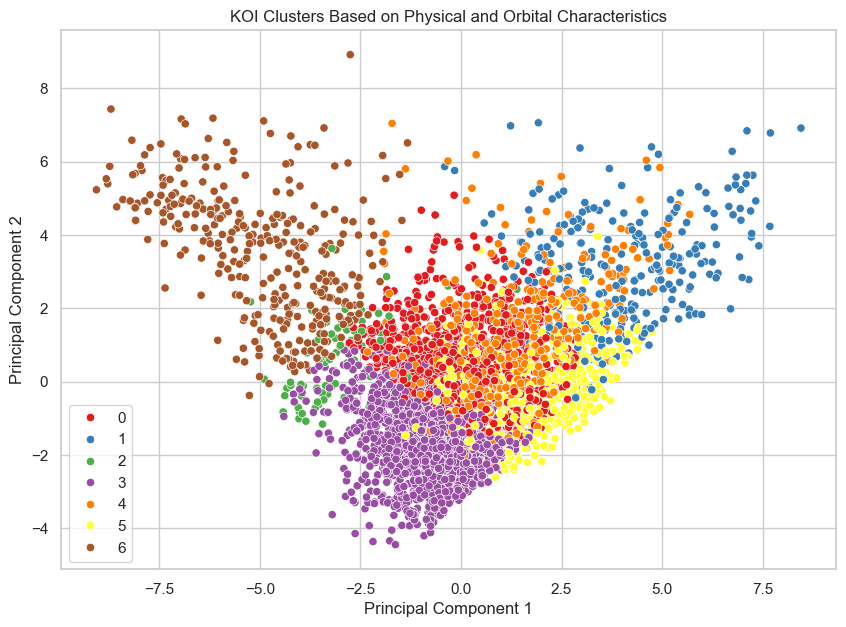

In [121]:
# Visualize the clusters with the help of PCA (2 components)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

df3['PCA1'] = X_pca[:, 0]
df3['PCA2'] = X_pca[:, 1]

plt.figure(figsize=(10, 7))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=df3, palette='Set1')
plt.title('KOI Clusters Based on Physical and Orbital Characteristics')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend();

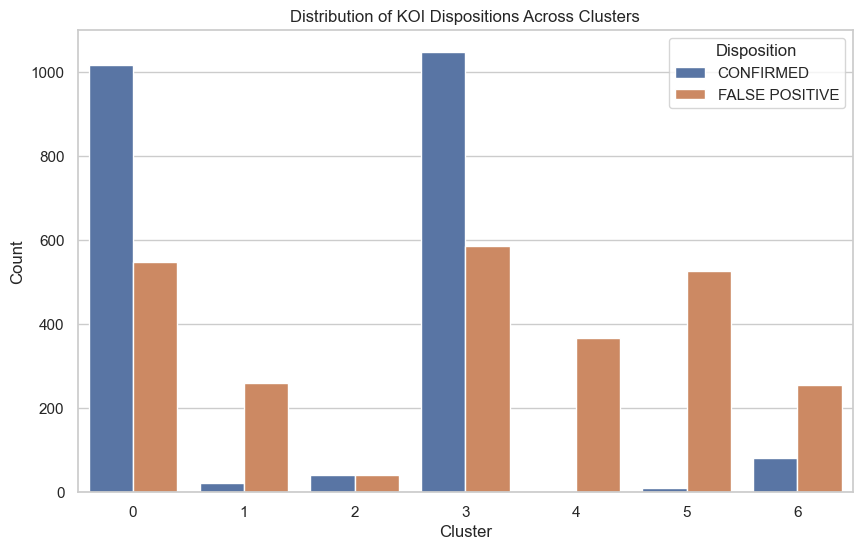

In [122]:
# Also plot the distribution of each cluster, evaluating visualy our clusters efficiency
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', hue='koi_disposition', data=df3)
plt.title('Distribution of KOI Dispositions Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Disposition');

Although we have a good separation on clusters 1, 4 and 5 the number of clusters is too high so we need to simplify our model

We repeat the same process using the feature importance table from question 2 to reduce the features and try to see if the results are more conclusive

In [123]:
# Get the top 8 features from the relevant features list
relevant_features = planetary_variables + stellar_variables
top_8_features = feature_importance_df.loc[feature_importance_df['Feature'].isin(relevant_features)].head(8)['Feature'].tolist()
print("Top 8 Features:", top_8_features)

Top 8 Features: ['koi_prad', 'koi_ror', 'koi_dor', 'koi_period', 'koi_depth', 'koi_insol', 'koi_impact', 'koi_smet']


In [124]:
# Select only the top 8 features
X_top8 = df3[top_8_features]

In [125]:
# Standardize the features
scaler = StandardScaler()
X_scaled_top8 = scaler.fit_transform(X_top8)

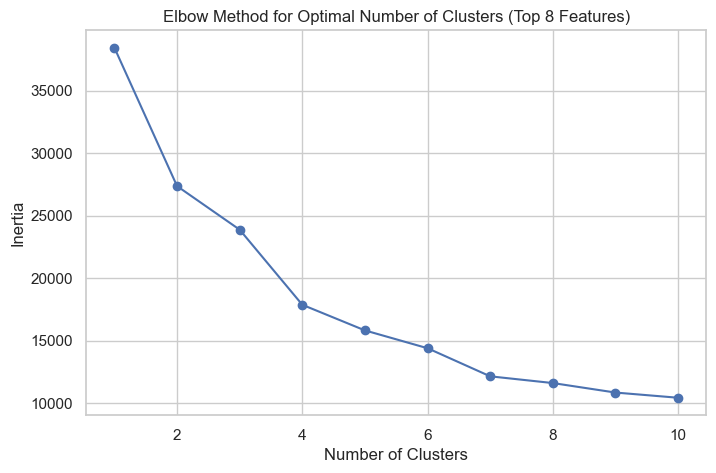

In [126]:
# Creating the arrays for the elbow method
inertia = []
cluster_range = range(1, 11)

for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled_top8)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters (Top 8 Features)');

In this graph we have a good cluster choice with smaller number of clusters (4)

In [127]:
# Initiating k-means with 4 clusters this time
kmeans = KMeans(n_clusters=4, random_state=42)
df3.loc[:, 'Cluster'] = kmeans.fit_predict(X_scaled_top8)

In [128]:
# Plotting again the results with PCA
pca = PCA(n_components=2)
X_pca_top8 = pca.fit_transform(X_scaled_top8)

df3.loc[:, 'PCA1'] = X_pca_top8[:, 0]
df3.loc[:, 'PCA2'] = X_pca_top8[:, 1]

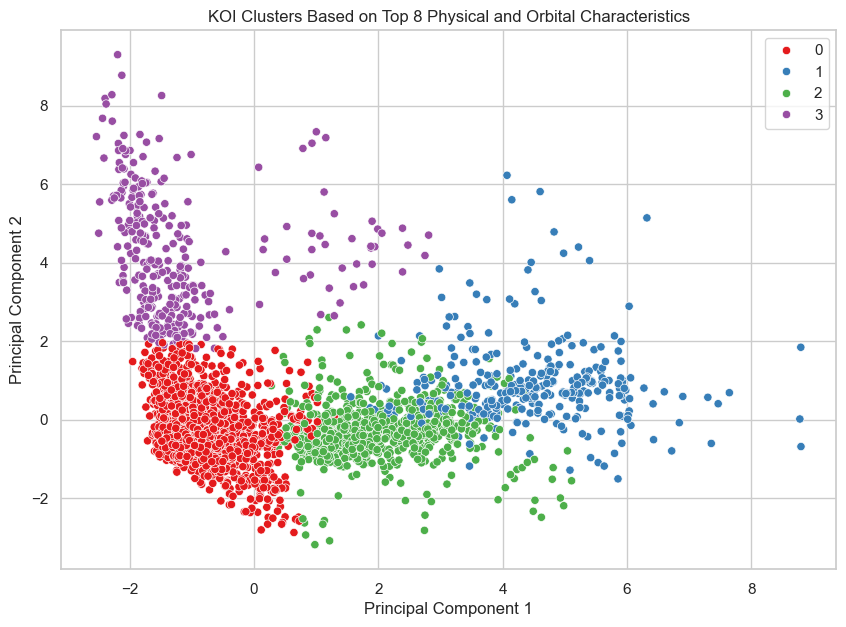

In [129]:
# Plot the new clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=df3, palette='Set1')
plt.title('KOI Clusters Based on Top 8 Physical and Orbital Characteristics')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend();

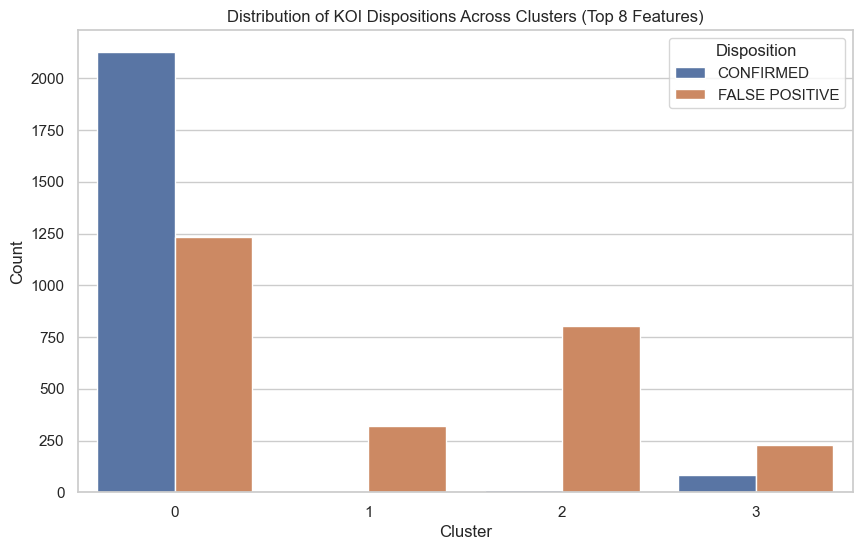

In [130]:
# Plot the new distribution within the clusters
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', hue='koi_disposition', data=df3)
plt.title('Distribution of KOI Dispositions Across Clusters (Top 8 Features)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Disposition');

Now we have a much better separation between the classes, indicating that we can indeed identify clusters of KOIs based on their physical and orbital characteristics. Idealy we would isolate the 0 cluster and try to split it into more clusters to have a clearer separation and find hidden patterns.

## Question 4: What are the main features that determine the confidence value koi_score and how good of an estimator is it?

In [131]:
# Getting a copy to work with without altering df data
df4=df.copy()

In [132]:
# Dropping the different wavelength bands (we are using only the keppler magnitude) and koi_pdisposition
df4.drop(['koi_gmag','koi_rmag','koi_imag','koi_zmag','koi_jmag','koi_hmag','koi_kmag','koi_pdisposition'], axis=1, inplace=True)

In [133]:
# Checking for target's missing values
df4['koi_score'].isnull().sum()

1510

In [134]:
# We have 1510 missing rows that is aproximately 15% of the whole dataset so we investigate more the distribution and why they are missing

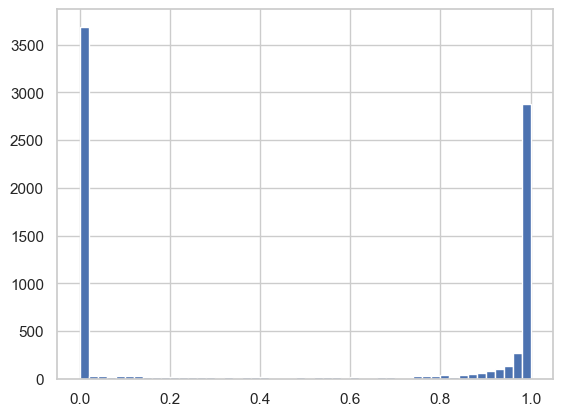

In [135]:
# Distribution of the column with the most missing values(from the ones we are interested) 
plt.hist(df4['koi_score'],50);

In [136]:
# Plotting missingno heatmaps to see correlation of nan values with all the columns available(understand why they are missing)

In [137]:
# Splitting the columns into two halves (excluding 'koi_score' from splits)
columns = df4.columns.tolist()
columns.remove('koi_score')
half=len(columns)//2

In [138]:
first_half = ['koi_score'] + columns[:half]
second_half = ['koi_score'] + columns[half:]

<Figure size 1000x500 with 0 Axes>

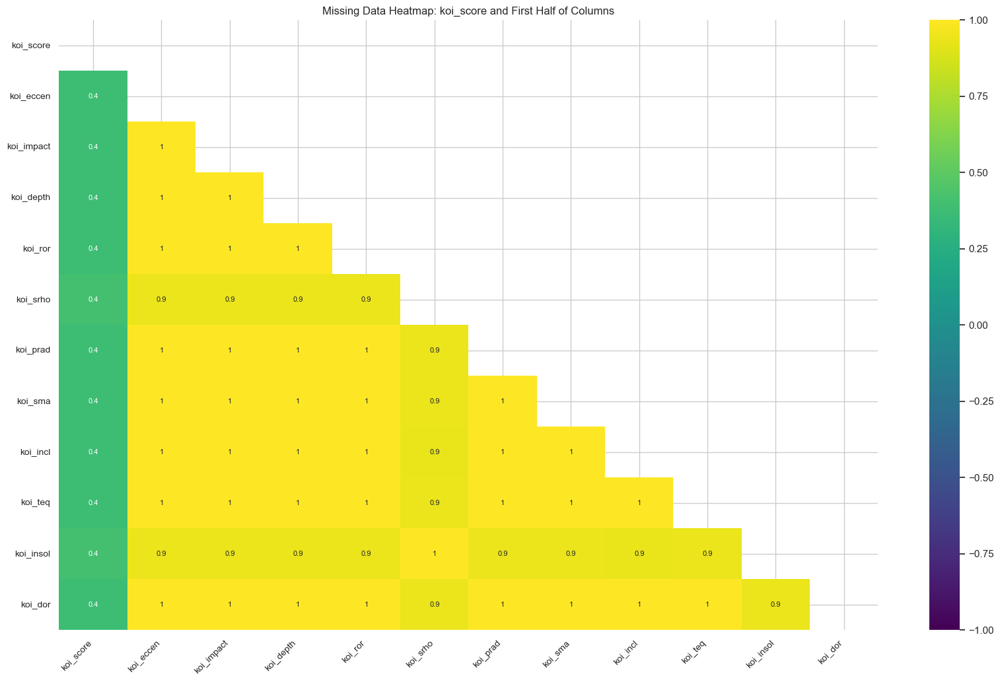

In [139]:
# Creating heatmaps for the first half
plt.figure(figsize=(10, 5))
msno.heatmap(df4[first_half], cmap="viridis", fontsize=10)
plt.title("Missing Data Heatmap: koi_score and First Half of Columns");

<Figure size 1000x500 with 0 Axes>

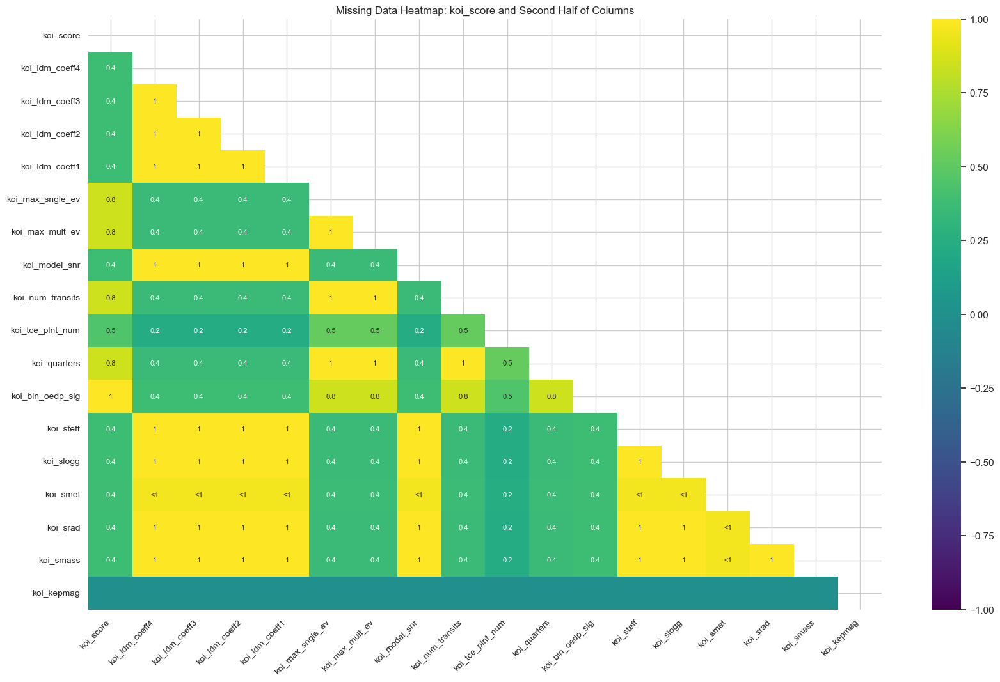

In [140]:
# Creating heatmaps for the second half
plt.figure(figsize=(10, 5))
msno.heatmap(df4[second_half], cmap="viridis", fontsize=10)
plt.title("Missing Data Heatmap: koi_score and Second Half of Columns");

In [141]:
# Not all the columns have missing values leading to 2 not equally distributed graphs
# Also koi_kepmag has only 1 missing value, thats why is like that on the graph

In [142]:
# We can see there is a full correlation of the missing values with column koi_bin_oedp_sig so we search into that column

koi_bin_oedp_sig is a metric used to help identify false positives in transit signals detected by the Kepler space telescope. To summarise the use, it detects whether the dips in signals are from planets or stars eclipsing between the scope and the target planet.

Since that column determines whether the detected signals are indeed from the targeted star we can not impute the missing values by any means and we opt to drop all the rows with missing data

Also koi_score is significant for the analysis and is the target variable, so imputing the target column is not possible

In [143]:
# Dropping target's missing values
df4.dropna(subset=['koi_score'], inplace=True)

In [144]:
df4.isnull().sum()

koi_disposition      0
koi_score            0
koi_fpflag_nt        0
koi_fpflag_ss        0
koi_fpflag_co        0
koi_fpflag_ec        0
koi_period           0
koi_time0bk          0
koi_time0            0
koi_eccen           59
koi_impact          59
koi_duration         0
koi_depth           59
koi_ror             59
koi_srho            17
koi_prad            59
koi_sma             59
koi_incl            59
koi_teq             59
koi_insol           17
koi_dor             59
koi_ldm_coeff4      59
koi_ldm_coeff3      59
koi_ldm_coeff2      59
koi_ldm_coeff1      59
koi_max_sngle_ev     0
koi_max_mult_ev      0
koi_model_snr       59
koi_count            0
koi_num_transits     0
koi_tce_plnt_num     0
koi_quarters         0
koi_bin_oedp_sig     0
koi_steff           59
koi_slogg           59
koi_smet            65
koi_srad            59
koi_smass           59
ra                   0
dec                  0
koi_kepmag           1
dtype: int64

The rest of the missing values are insignificant to the total number of rows that we have and since we are not interested in outliers or detecting abnormal behaviour or events we opt to drop them as well

In [145]:
# Dropping the rest of missing values
df4=df4.dropna()

In [146]:
# Drop 'koi_disposition' column before calculating correlation
df4_features = df4.drop(columns=['koi_disposition'])

In [147]:
# Compute the correlation matrix
correlation_matrix = df4_features.corr()

# Sort correlations with koi_score
koi_score_corr = correlation_matrix['koi_score'].abs().sort_values(ascending=False)
koi_score_corr = koi_score_corr.drop('koi_score')
print("Top 10 correlations with koi_score:\n", koi_score_corr.head(10))

Top 10 correlations with koi_score:
 koi_fpflag_ss       0.560624
koi_fpflag_co       0.514504
koi_fpflag_ec       0.401467
koi_count           0.390448
koi_incl            0.355081
koi_teq             0.302384
koi_depth           0.301226
koi_smet            0.293354
koi_num_transits    0.290730
koi_model_snr       0.269326
Name: koi_score, dtype: float64


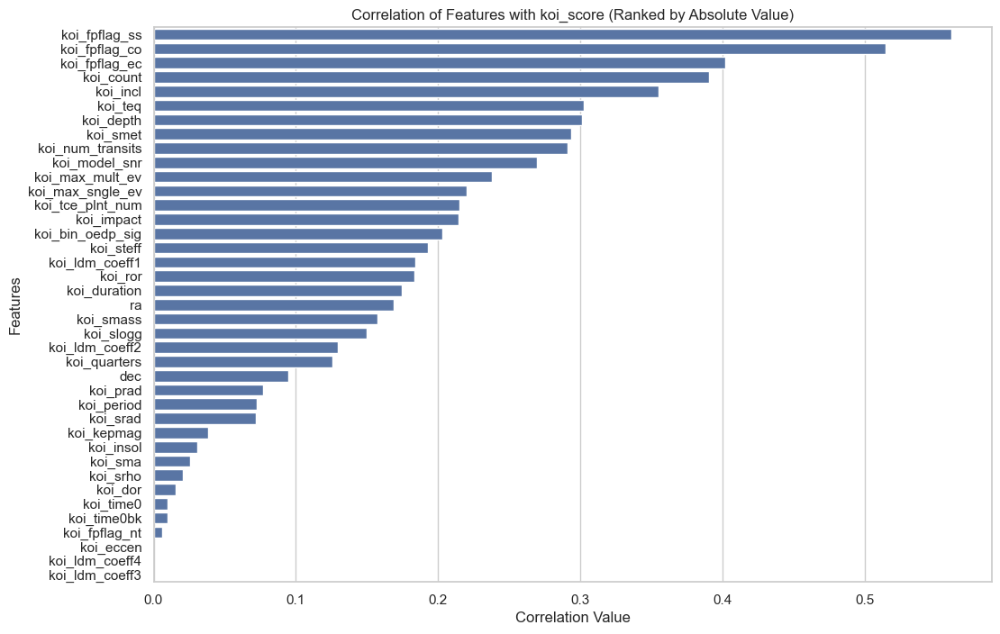

In [148]:
# Visualize correlations with koi_score by absolute value
plt.figure(figsize=(12, 8))
sns.barplot(y=koi_score_corr.index, x=koi_score_corr.values)
plt.title("Correlation of Features with koi_score (Ranked by Absolute Value)")
plt.xlabel("Correlation Value")
plt.ylabel("Features");

In [149]:
# Checking the top 10 features for validation
top_features = koi_score_corr.head(10).index

In [150]:
# Performing a Pearson correlation test to confirm the certainty of the features significance
for feature in top_features:
    r, p = pearsonr(df4_features[feature], df4_features['koi_score'])
    print(f'{feature}: r = {r:.3f}, p-value = {p:.4e}')

koi_fpflag_ss: r = -0.561, p-value = 0.0000e+00
koi_fpflag_co: r = -0.515, p-value = 0.0000e+00
koi_fpflag_ec: r = -0.401, p-value = 3.6722e-307
koi_count: r = 0.390, p-value = 3.3370e-289
koi_incl: r = 0.355, p-value = 4.9072e-236
koi_teq: r = -0.302, p-value = 1.5256e-168
koi_depth: r = -0.301, p-value = 3.3008e-167
koi_smet: r = 0.293, p-value = 2.7149e-158
koi_num_transits: r = -0.291, p-value = 2.2048e-155
koi_model_snr: r = -0.269, p-value = 8.6387e-133


In [151]:
# Filter out rows where 'koi_disposition' is 'CANDIDATE'
df_filtered = df4[df4['koi_disposition'] != 'CANDIDATE']
df_filtered = df_filtered.copy()

In [152]:
# Drop 'koi_disposition' before training the model
X = df_filtered.drop(columns=['koi_score', 'koi_disposition'])
y = df_filtered['koi_score']

In [153]:
# Fit a Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)

In [154]:
# Perform 5-fold cross-validation (scoring with r2 instead of accuracy un the classifier)
cv_scores = cross_val_score(rf, X, y, cv=5, scoring='r2')
print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", np.mean(cv_scores))

Cross-validation scores: [ 0.85002817  0.87228469  0.87281679  0.76630439 -0.01422542]
Mean cross-validation score: 0.6694417238780066


In [155]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [156]:
# Model performance
rf.fit(X_train, y_train);
y_pred = rf.predict(X_test)
print("Mean Squared Error:", mean_squared_error(y_test, y_pred))
print("R2 Score:", r2_score(y_test, y_pred))

Mean Squared Error: 0.026366817898563877
R2 Score: 0.8864270239681067


In [157]:
# Calculating koi_score variance so it can be compared with mse for meaningful analysis
koi_score_variance = np.var(df4_features['koi_score'], ddof=0)  # Population variance
print(f"Variance of koi_score: {koi_score_variance:.4f}")

Variance of koi_score: 0.2275


In [158]:
# Feature importance
importances = rf.feature_importances_
feature_names = X.columns

# Sort and visualize feature importance
sorted_indices = importances.argsort()[::-1]

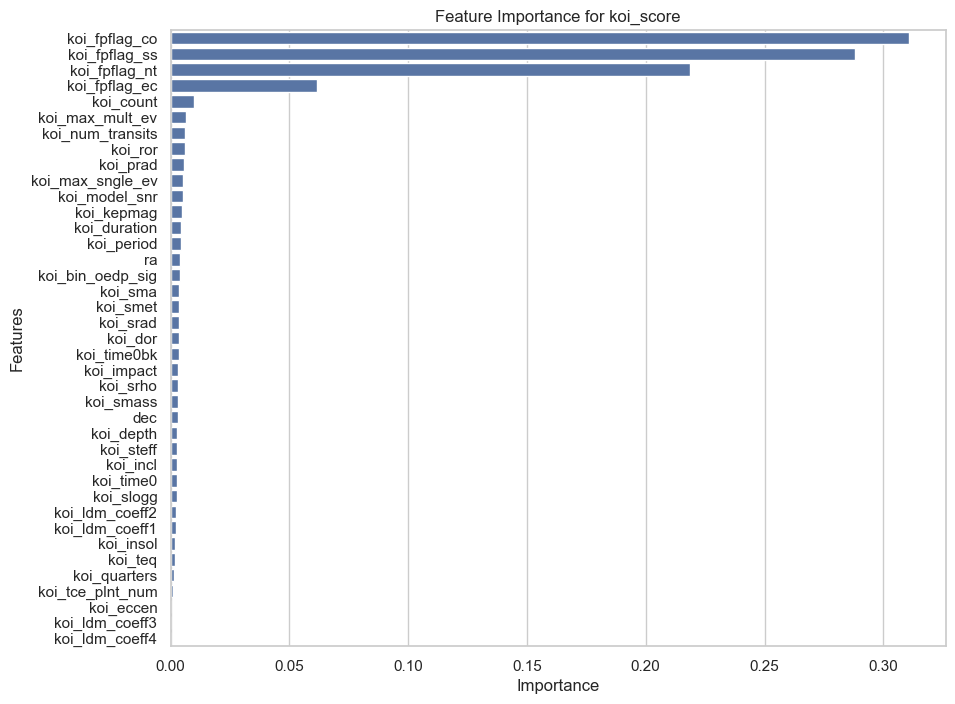

In [159]:
# Plot feature importance from the trained model
plt.figure(figsize=(10, 8))
sns.barplot(y=feature_names[sorted_indices], x=importances[sorted_indices])
plt.title("Feature Importance for koi_score")
plt.xlabel("Importance")
plt.ylabel("Features");

Is clear from the feature importance barplot that koi_score mainly depends on the 4 koi_fpflags that contain binary values and represent different threshold events

Checking how good of an estimator koi_score is comparing its value with the final classification of the planets

In [160]:
# Create a binary classification for confirmed exoplanets (1) vs false positives (0)
df_filtered.loc[:, 'is_confirmed'] = df_filtered['koi_disposition'].apply(lambda x: 1 if x == 'CONFIRMED' else 0)

In [161]:
# Define a range of thresholds to test
thresholds = np.linspace(0, 1, 100)

In [162]:
# Compute accuracy for each threshold
accuracies = []
for threshold in thresholds:
    predicted = (df_filtered['koi_score'] >= threshold).astype(int)
    acc = accuracy_score(df_filtered['is_confirmed'], predicted)
    accuracies.append(acc)

In [163]:
# Find the threshold that gives the maximum accuracy
max_accuracy = max(accuracies)
optimal_threshold = thresholds[np.argmax(accuracies)]

In [164]:
# Print best threshold and corresponding accuracy
print(f"Optimal Threshold: {optimal_threshold:.3f}")
print(f"Maximum Accuracy: {max_accuracy:.2%}")

Optimal Threshold: 0.576
Maximum Accuracy: 97.20%


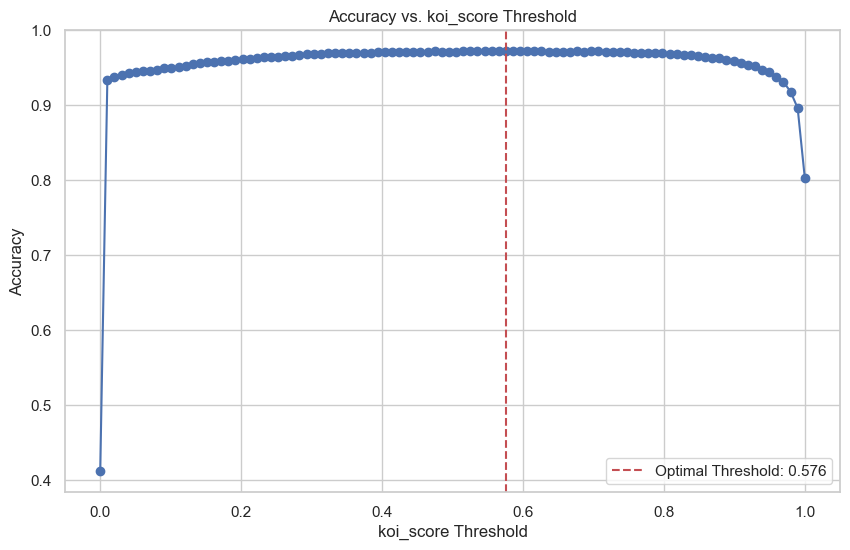

In [165]:
# Plot accuracy vs. threshold
plt.figure(figsize=(10, 6))
plt.plot(thresholds, accuracies, marker='o')
plt.axvline(optimal_threshold, color='r', linestyle='--', label=f'Optimal Threshold: {optimal_threshold:.3f}')
plt.title("Accuracy vs. koi_score Threshold")
plt.xlabel("koi_score Threshold")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)

koi_score estimator showing big sensitivity on the confirmed planets, as a threshold of as low as 0.05 can give us more than 90% confidence that the planet will be confirmed. For this current dataset a threshold of 0.576 gives the best accuracy with 97.2%

In [166]:
# Generate predictions using the optimal threshold
df_filtered.loc[:, 'predicted_confirmed'] = (df_filtered['koi_score'] >= optimal_threshold).astype(int)

# Compute the confusion matrix
cm = confusion_matrix(df_filtered['is_confirmed'], df_filtered['predicted_confirmed'])
labels = ['False Positive', 'Confirmed']

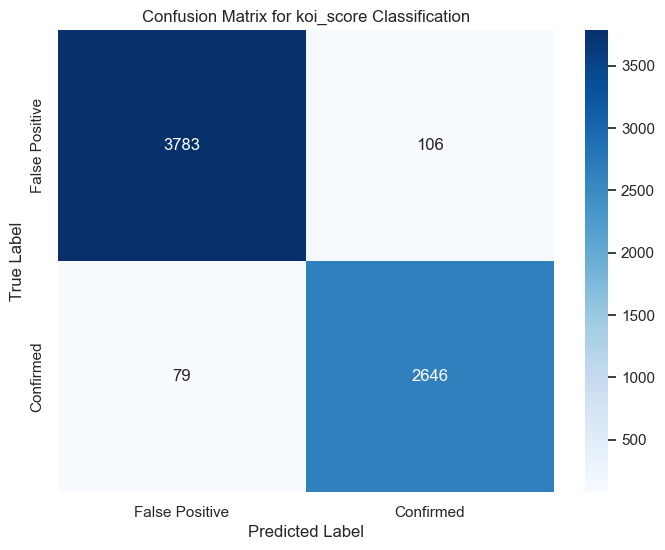

In [167]:
# Plot confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for koi_score Classification");

In [168]:
# Print classification report
print("\nClassification Report:\n", classification_report(df_filtered['is_confirmed'], df_filtered['predicted_confirmed']))


Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.97      0.98      3889
           1       0.96      0.97      0.97      2725

    accuracy                           0.97      6614
   macro avg       0.97      0.97      0.97      6614
weighted avg       0.97      0.97      0.97      6614

